In [236]:
##NEWEST VERSION
!pip install sklearn
from ipfx.feature_extractor import (SpikeFeatureExtractor, SpikeTrainFeatureExtractor)


import pyabf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob
from itertools import compress
from scipy.signal import find_peaks
from scipy.signal import peak_widths
from scipy.signal import peak_prominences
from scipy.optimize import curve_fit
from scipy.stats import linregress
import scipy.stats
import pandas as pd
import seaborn as sns
sns.set()
 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
# Function to calculate dv/dt
def dv_dt (abf, sweep, sampling_rate, half_window_ms):
    # Select the trace in your recording
    sweep = abf.setSweep(sweepNumber=sweep, channel=0)
    # Identify the action potential with highest dV
    dv = np.diff(abf.sweepY)
    dv_max = np.argmax(dv)

    print(abf.sweepX[dv_max])
    # Set the time window for the selected action potential
    sampling_rate = sampling_rate
    half_window_ms = half_window_ms
    half_window = (half_window_ms * sampling_rate)//1000
    global t_window
    t_window = abf.sweepX[dv_max-half_window:dv_max+half_window]
    v_window = abf.sweepY[dv_max-half_window:dv_max+half_window]
    # Calculate dv_dt for the selected action potential
    dv_ap = np.diff(v_window)
    dt_ap = np.diff(t_window*1000)
    dv_dt = (dv_ap)/(dt_ap)
    dv_dt_max = np.amax(dv_dt)
    # Remove the first v value to match the dv/dt array which is n-1
    v_ap_array = np.delete(v_window, 1)
    # Return the selected outputs from the function
    return {'voltage': v_window, 'dv_dt': dv_dt, 
            'dv_dt_max': dv_dt_max, 'time': t_window,
            'voltage_array': v_ap_array}

# Define the logarithmic function
def logarithmic_function(x, a, b):
    return a * np.log(x) + b


def spike_analysis(abf_file):
    fig = plt.figure()
    name = str(abf_file)
    folder_path = abf_file.split('/')
    file_name = folder_path[-1]
    file_name = file_name[:-4]
    print(file_name)
    parts = file_name.split('_')
    date = parts[0] + parts[1] + parts[2]
    protocol_num = parts[3]
    slice_num = parts[4]
    cell_num = parts[5]
    region = parts[6]
    layer = parts[7]
    treatment = parts[8]
    cell_type = parts[9]
    genotype = parts[10]
    rheobase = None
    abf = pyabf.ABF(abf_file)
    # Set the table from the dataframe below
    dataframe = [] 
    abf.setSweep(0)
    time = abf.sweepX
    voltage = abf.sweepY
    current = abf.sweepC
    start = None
    for t in time:
        if t > 0.18:
            start = t
            break
    end = None
    for t in time: 
        if t > 1.2:
            end = t
            break
    # Loop function to analyze each voltage trace of the file
    for sweepNumber in abf.sweepList:
        if rheobase == None:
            pass
        else:
            if sweepNumber > rheobase + 10:
                break
        abf.setSweep(sweepNumber)
        time = abf.sweepX
        voltage = abf.sweepY
        current = abf.sweepC
        # Parameters for analysis: 
        sfx = SpikeFeatureExtractor (start, end, 
                                     filter=None, # cutoff frequency for 4-pole low-pass Bessel filter in kHz 
                                     dv_cutoff=25.0,  # minimum dV/dt to qualify as a spike in V/s 
                                     thresh_frac=0.05,  # fraction of average upstroke for threshold calculation
                                     min_peak=0, max_interval=0.05)  
        sfx_results = sfx.process(time, voltage, current)
        if not sfx_results.empty:
            if rheobase == None:
                rheobase = sweepNumber
            else:
                pass
            #x_vals = time[start_index:sfx_results['threshold_index'][0]]
            #y_vals = voltage[start_index:sfx_results['threshold_index'][0]]
            #params, _ = curve_fit(logarithmic_function, x_vals, y_vals)
            # Generate line of best fit
            #x_fit = np.linspace(min(x_vals), max(x_vals), len(x_vals))
            #y_fit = logarithmic_function(x_fit, *params)
            # Calculate R-squared value
            #y_predicted = logarithmic_function(x_vals, *params)
            #slope, intercept, r_value, p_value, std_err = linregress(y_vals, y_predicted)
            #r_squared = r_value ** 2
            #if r_squared > 0.75:
            num_rows = sfx_results.shape[0]
            current = {'date': date, 'protocol_num': protocol_num, 'slice': slice_num, 'cell': cell_num, 'region': region, 'layer': layer, 'treatment': treatment, 'cell_type': cell_type, 'animal_genotype': genotype}
            current = pd.DataFrame([current])
            current = pd.concat([current] * num_rows, ignore_index=True)
            my_list = [sweepNumber] * num_rows
            #r_squared_rise = [r_squared] * num_rows
            file_list = [file_name] * num_rows
            #end_column = pd.Series(r_squared_rise, name='r_squared_rise')
            new_column = pd.Series(my_list, name='sweep')
            file_column = pd.Series(file_list, name = 'file_name')
            new_frame = pd.concat([current, file_column, new_column, sfx_results], axis = 1)
            dataframe.append(new_frame)  # To get the mean: df.append(sfx_results.mean())
            plt.plot(abf.sweepX, abf.sweepY, alpha=.6, label="sweep %d" % (sweepNumber))
            #plt.scatter(sfx_results['threshold_t'], sfx_results['threshold_v'])
            plt.scatter(sfx_results['peak_t'], sfx_results['peak_v'])
    plt.xlim(0.185, 1.2)
    plt.show()
    indiv_table = pd.concat(dataframe)
    return indiv_table
    
def input_output(abf_file):
    name = str(abf_file)
    folder_path = abf_file.split('/')
    file_name = folder_path[-1]
    file_name = file_name[:-4]
    print(file_name)
    parts = file_name.split('_')
    date = parts[0] + parts[1] + parts[2]
    protocol_num = parts[3]
    slice_num = parts[4]
    cell_num = parts[5]
    region = parts[6]
    layer = parts[7]
    treatment = parts[8]
    cell_type = parts[9]
    genotype = parts[10]
    abf = pyabf.ABF(abf_file)
    # Set the dataframe for the table
    table = pd.DataFrame()
    currents = [] # Current value between t1 and t2 (ms) for each step
    rheobase = None
    # Loop function to analyze each voltage and current trace of the file
    for sweep in abf.sweepList:
        if rheobase == None:
            pass
        else:
            if sweep > rheobase + 10:
                break  
        abf.setSweep(sweep)
        time = abf.sweepX
        voltage = abf.sweepY
        current = abf.sweepC
        
        current_mean = np.average(abf.sweepC[t1:t2])
        currents.append(np.average(abf.sweepC[t1:t2]))
        start = None
        for t in time:
            if t > 0.18:
                start = t
                break
        end = None
        for t in time: 
            if t > 1.2:
                end = t
                break
        sfx = SpikeFeatureExtractor (start, end, 
                                 filter=None, # cutoff frequency for 4-pole low-pass Bessel filter in kHz 
                                 dv_cutoff=25.0,  # minimum dV/dt to qualify as a spike in V/s 
                                 thresh_frac=0.05,  # fraction of average upstroke for threshold calculation
                                 min_peak=0, max_interval=0.05) 
        sfx_results = sfx.process(time, voltage, current)
        if not sfx_results.empty:
            if rheobase == None:
                rheobase = sweep
            else:
                pass
        stfx = SpikeTrainFeatureExtractor (start=start, end=end)
        stfx_results = stfx.process(time, voltage, current, sfx_results)

        # Create a table with the stfx results
        length = len(table)
        table.loc[length, 'current_step'] = current_mean
        table.loc[length, 'avg_rate'] = stfx_results["avg_rate"]
        current = {'date': date, 'protocol_num': protocol_num, 'slice': slice_num, 'cell': cell_num, 'region': region, 'layer': layer, 'treatment': treatment, 'cell_type': cell_type, 'animal_genotype': genotype}
        current = pd.DataFrame([current])
        for col in current.columns:
            table.loc[length, col] = current[col].values[0]
        if stfx_results ['avg_rate'] > 0:
            table.loc[length, 'adaptation'] = stfx_results ["adapt"]
            table.loc[length, 'Latency_s'] = stfx_results ["latency"]
            table.loc[length, 'ISI_CV'] = stfx_results ["isi_cv"]
            table.loc[length, 'ISI_mean_ms'] = stfx_results ["mean_isi"]*1000
            table.loc[length, 'ISI_first_ms'] = stfx_results ["first_isi"]*1000
            
    # Optional Plotting: example with three subplots
    fig = plt.figure(figsize=(15, 5))
    # Input-output curve
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.scatter(currents, table.loc[:,'avg_rate'])
    ax1.set_xlabel('Current step (pA)')
    ax1.set_ylabel('Action potentials')
    # All traces
    ax2 = fig.add_subplot(2, 2, 2)
    for sweep in abf.sweepList:
        abf.setSweep(sweep)
        ax2.plot(abf.sweepX, abf.sweepY, alpha=.6, label="Sweep %d" % (sweep))
    ax2.set_ylabel('Membrane voltage (mV)')
    # ax2.legend() # Optional
    # To highllight one trace
    abf.setSweep(rheobase) 
    ax2.plot(abf.sweepX, abf.sweepY, linewidth=1, color='black')
    ax2.axes.set_xlim(0, 1.2) # Range of the x-axis (seconds)

    # All current steps
    ax3 = fig.add_subplot(2, 2, 4, sharex=ax2) 
    for sweep in abf.sweepList:
        abf.setSweep(sweep)
        current = abf.sweepC
        ax3.plot(abf.sweepX, current)
    ax3.set_ylabel("Current (pA)")
    ax3.set_xlabel("Time (s)")
    # To highllight one current trace
    abf.setSweep(rheobase) 
    ax3.plot(abf.sweepX, abf.sweepC, linewidth=1, color='black')
    fig.tight_layout()
    # Show the graph and the table results 
    plt.show()
    return table, rheobase

def phase_plots(abf_file, rheobase):
    abf = pyabf.ABF(abf_file)
    # Inputs (the abf file, sweep number, sampling rate, half-window in ms)
    dv_dt80 = dv_dt(abf, rheobase+8, 20000, 12)
    # Table with the voltage and dV/dt values
    table80 = pd.DataFrame(columns = ['voltage', 'dv_dt'])
    table80['voltage'] = pd.Series(dv_dt80['voltage'])
    table80['dv_dt'] = pd.Series(dv_dt80['dv_dt'])
    # Graphs
    fig = plt.figure(figsize=(6, 3))
    # Action potential
    ax1 = fig.add_subplot(121)
    ax1.set_title('Action potential Rheobase + 80pA')
    ax1.plot(dv_dt80['time'], dv_dt80['voltage'])
    ax1.set_ylabel("V (mV)") 
    ax1.set_xlabel("t (s)")
    # Phase plot
    ax2 =fig.add_subplot(122)
    ax2.set_title('Phase-plane plot Rheobase + 80pA')
    ax2.plot(dv_dt80['voltage_array'], dv_dt80['dv_dt'])
    ax2.set_ylabel("dV/dt (mV/ms)") 
    ax2.set_xlabel("V (mV)") 


2023_09_27_0065_slice5_cell1_cortex_layer2_100um-citrate_PN_WT


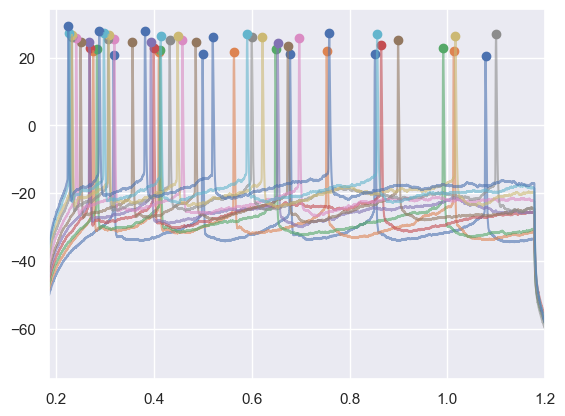

2023_09_27_0065_slice5_cell1_cortex_layer2_100um-citrate_PN_WT


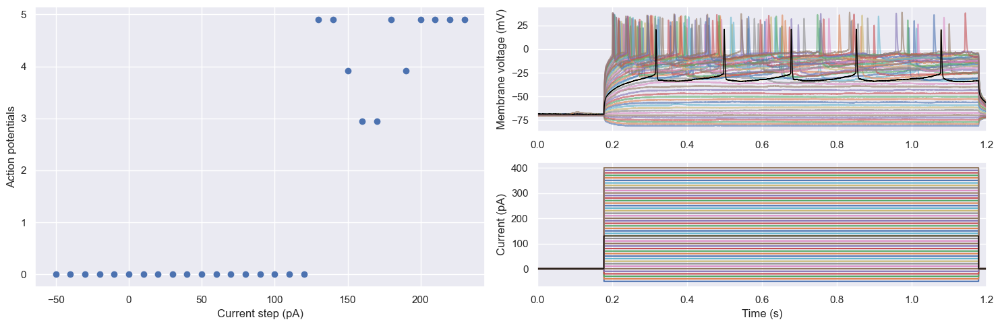

0.2306
2023_09_20_0036_slice1_cell1_cortex_layer2_washout_PN_WT


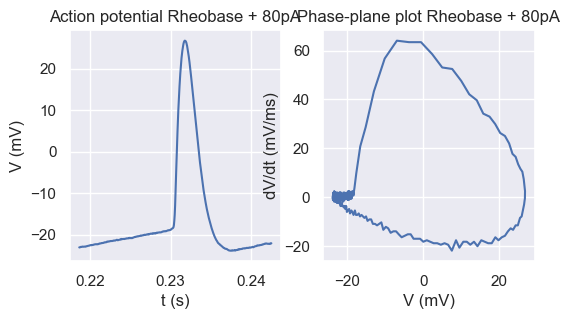

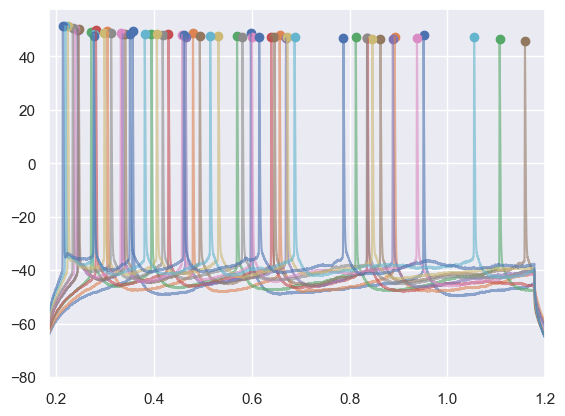

2023_09_20_0036_slice1_cell1_cortex_layer2_washout_PN_WT


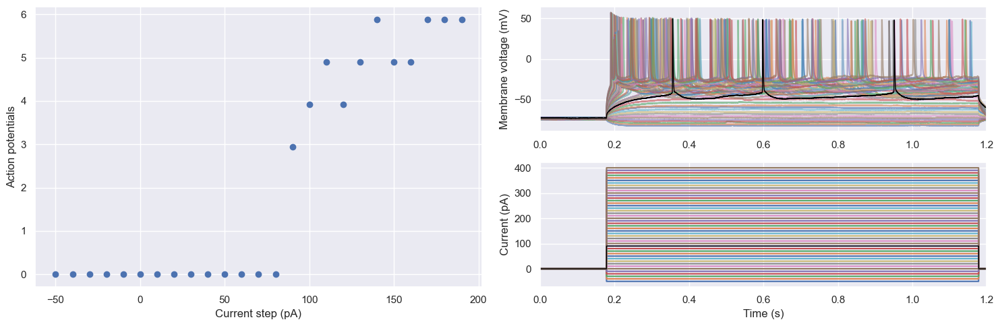

0.22310000000000002
2023_09_27_0019_slice2_cell1_cortex_layer2_100um-citrate_MSN_WT


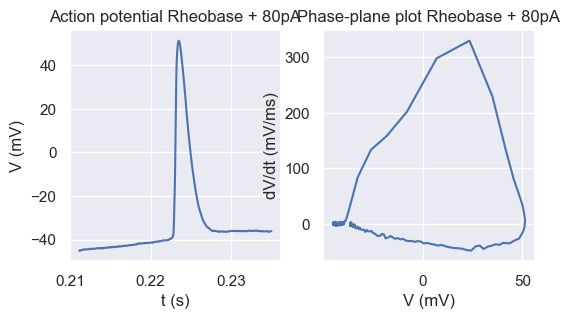

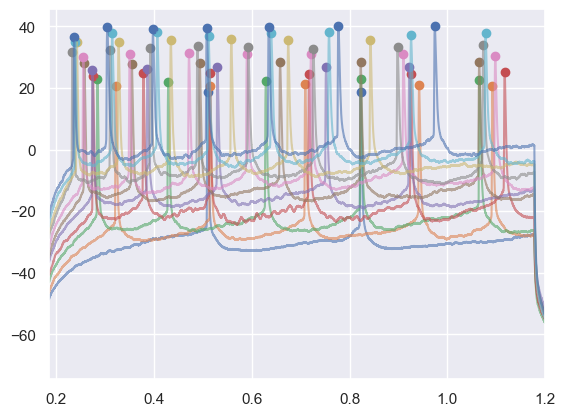

2023_09_27_0019_slice2_cell1_cortex_layer2_100um-citrate_MSN_WT


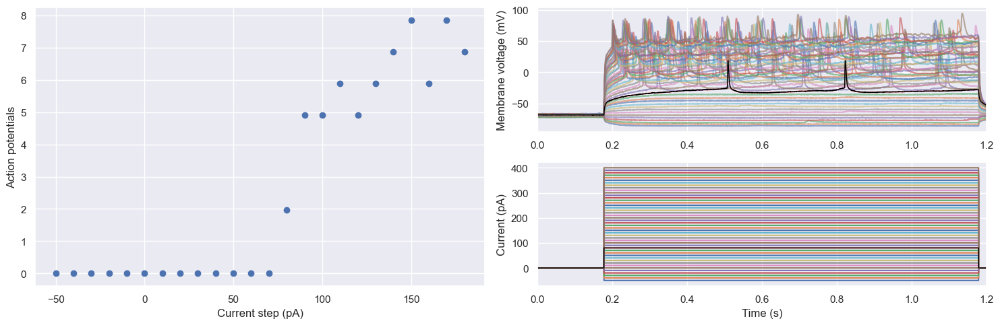

0.24050000000000002
2023_10_01_0028_slice2_cell1_cortex_layer2_no-treatment_MSN_KO


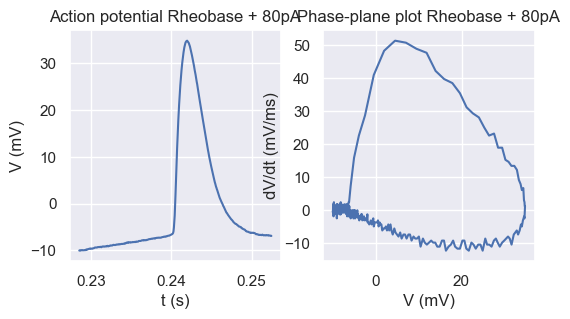

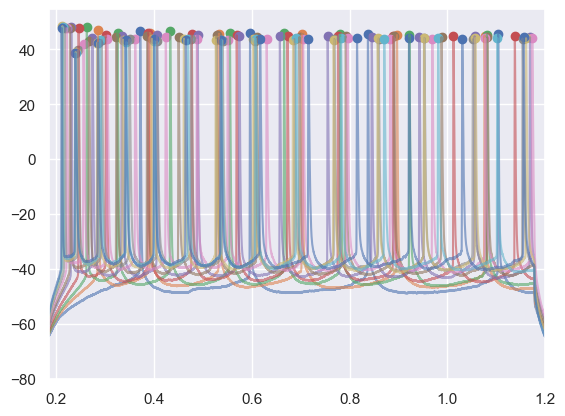

2023_10_01_0028_slice2_cell1_cortex_layer2_no-treatment_MSN_KO


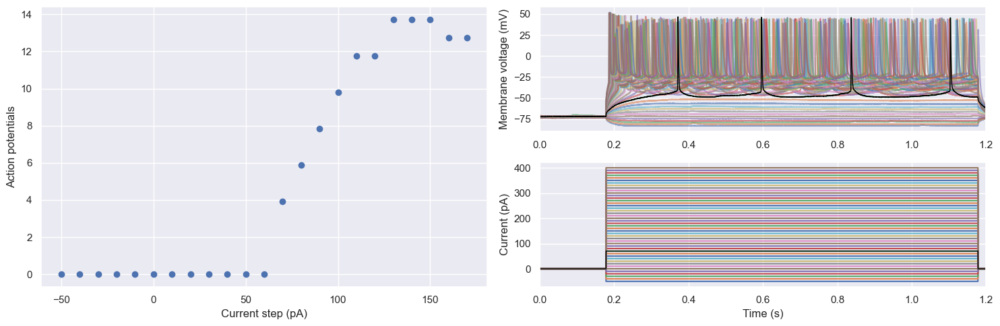

0.21165
2023_09_27_0059_slice5_cell1_cortex_layer2_25um-citrate_PN_WT


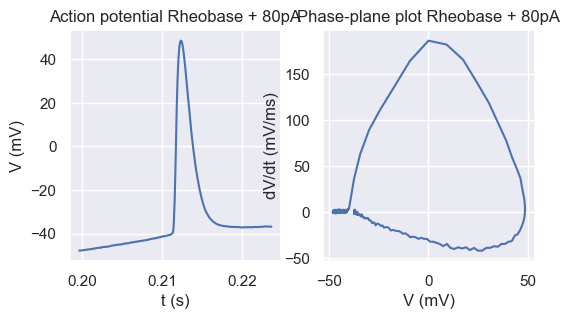

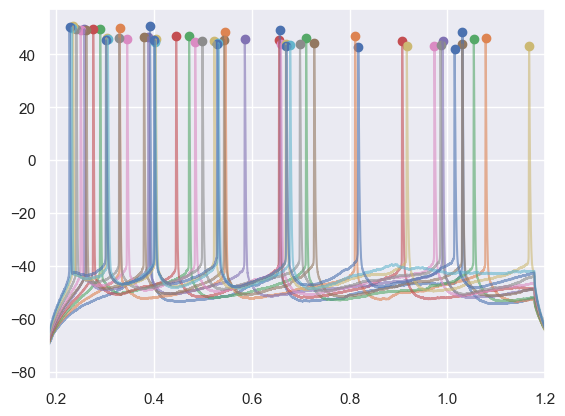

2023_09_27_0059_slice5_cell1_cortex_layer2_25um-citrate_PN_WT


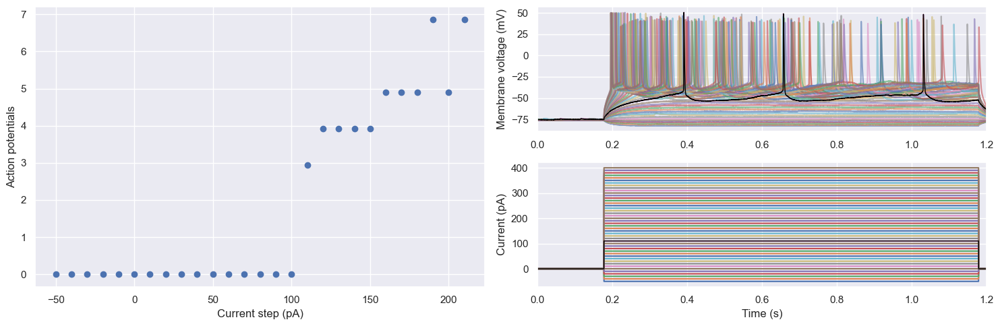

0.2336
2023_10_01_0031_slice2_cell1_cortex_layer2_25um-citrate_MSN_KO


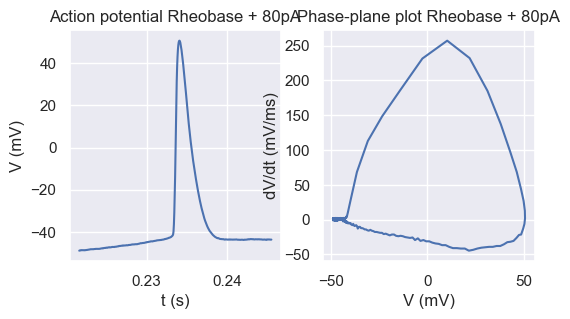

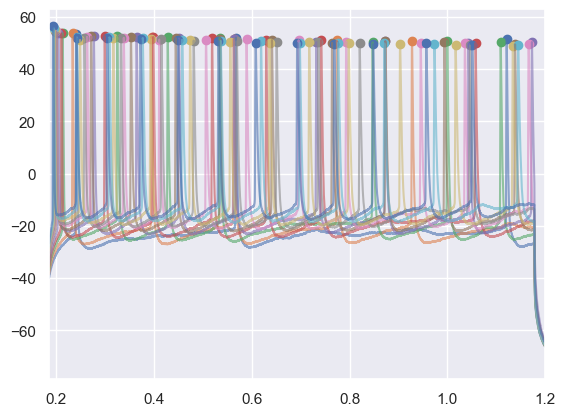

2023_10_01_0031_slice2_cell1_cortex_layer2_25um-citrate_MSN_KO


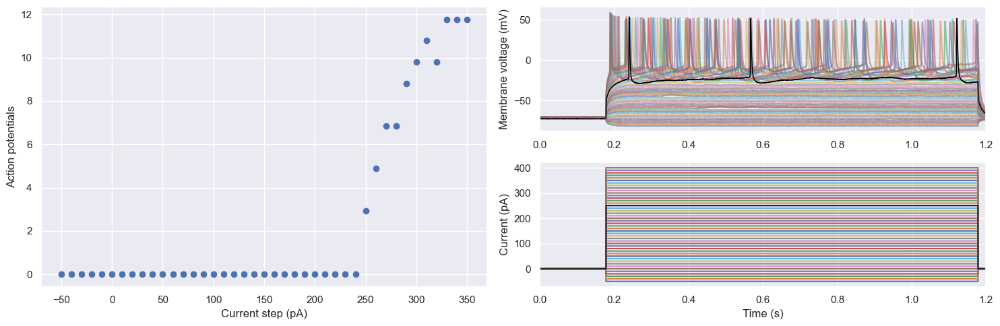

0.19525
2023_09_20_0024_slice1_cell1_cortex_layer2_50um-citrate_PN_WT


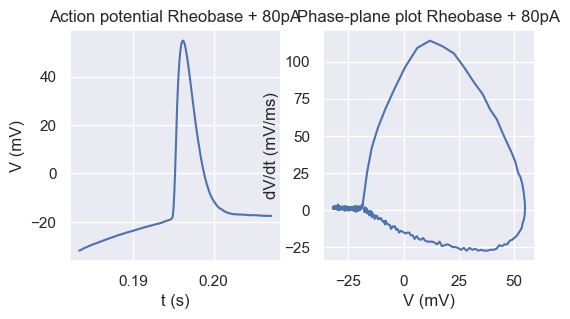

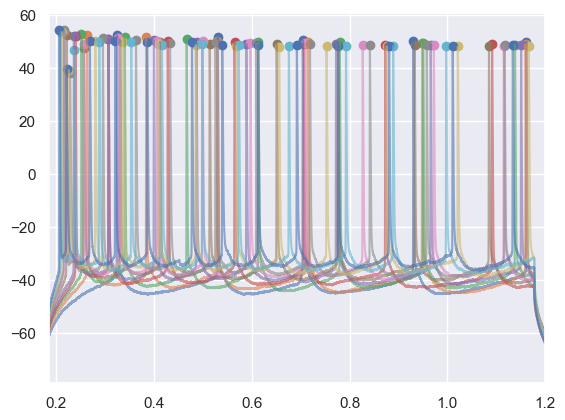

2023_09_20_0024_slice1_cell1_cortex_layer2_50um-citrate_PN_WT


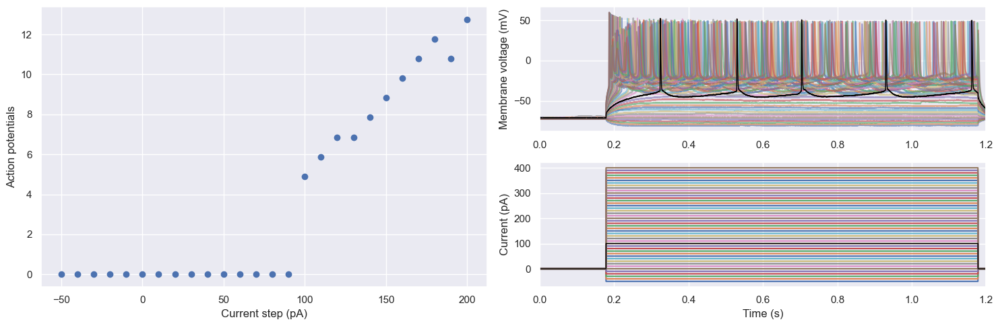

0.2101
2023_09_20_0052_slice3_cell2_cortex_layer2_100um-citrate_PN_WT


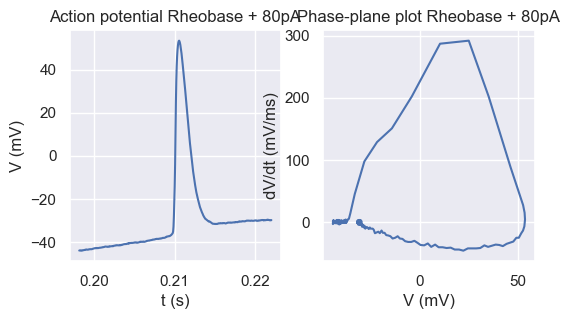

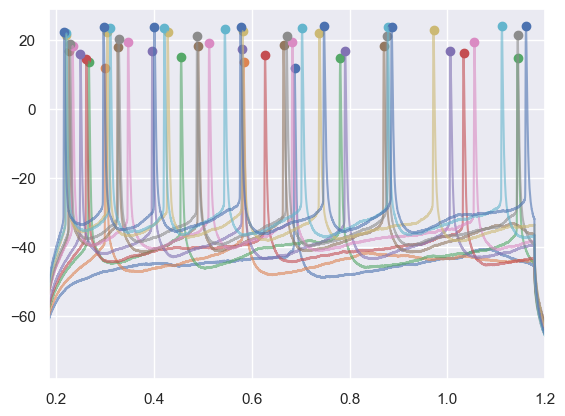

2023_09_20_0052_slice3_cell2_cortex_layer2_100um-citrate_PN_WT


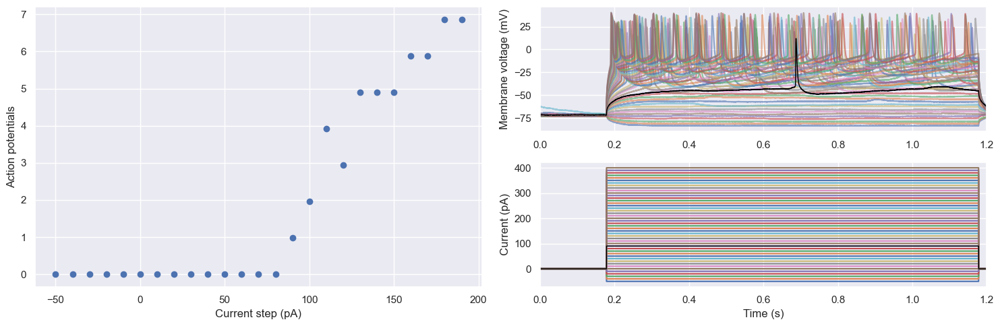

0.21855000000000002
2023_09_27_0051_slice4_cell1_cortex_layer2_200um-citrate_MSN_WT


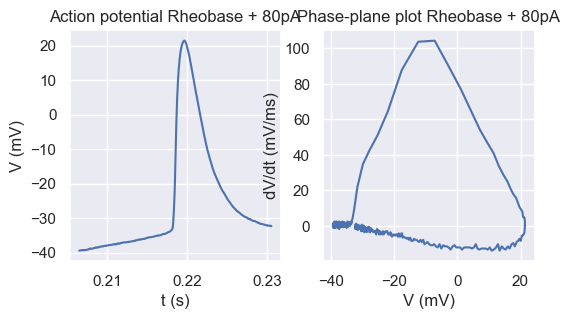

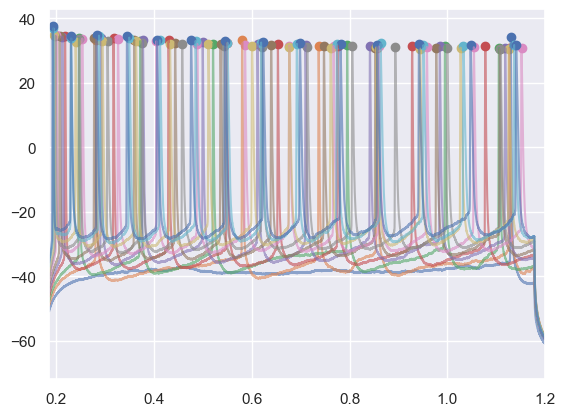

2023_09_27_0051_slice4_cell1_cortex_layer2_200um-citrate_MSN_WT


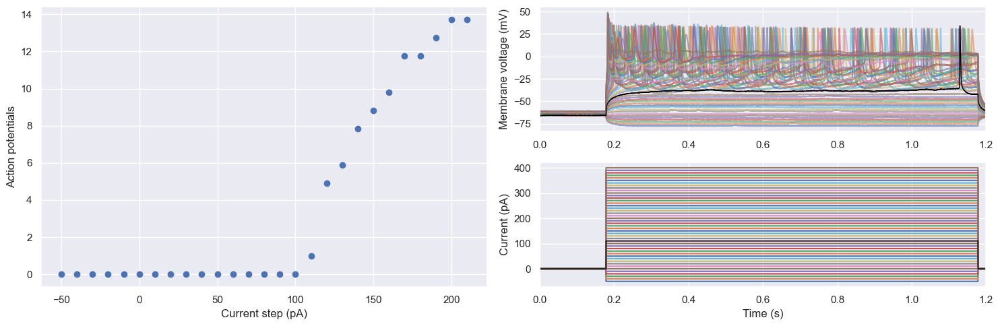

0.19410000000000002
2023_09_27_0062_slice5_cell1_cortex_layer2_50um-citrate_PN_WT


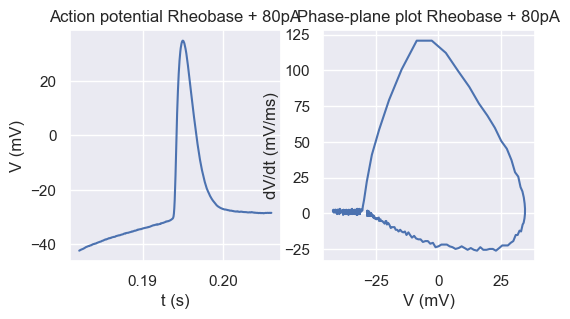

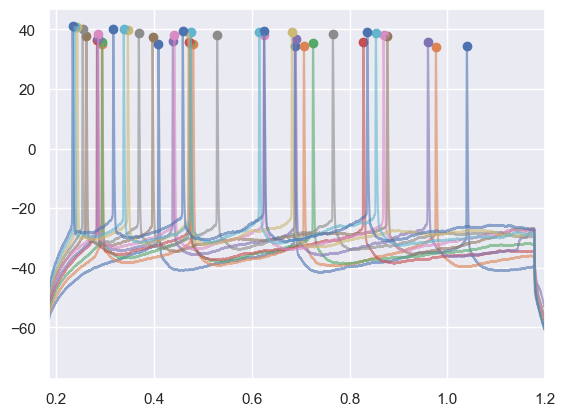

2023_09_27_0062_slice5_cell1_cortex_layer2_50um-citrate_PN_WT


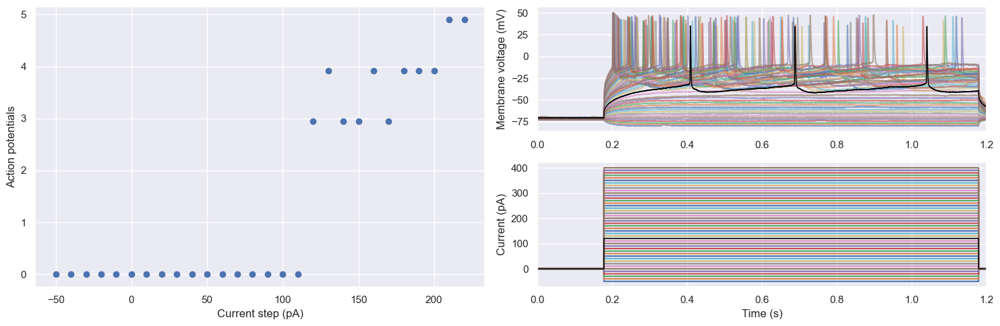

0.2417
2023_09_21_0000_slice3_cell2_cortex_layer2_400um-citrate_PN_WT


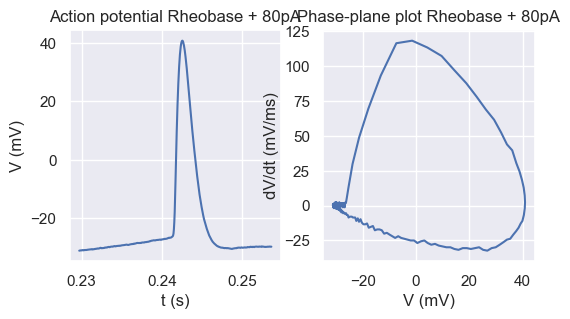

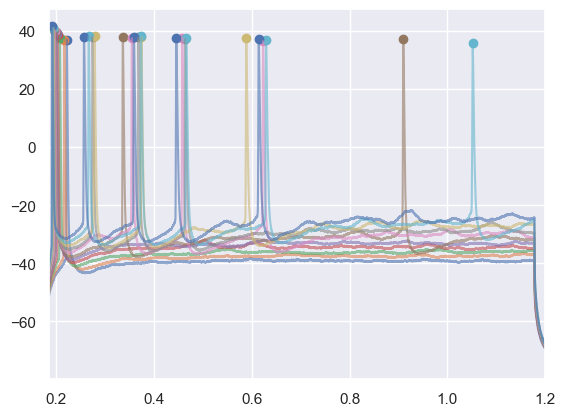

2023_09_21_0000_slice3_cell2_cortex_layer2_400um-citrate_PN_WT


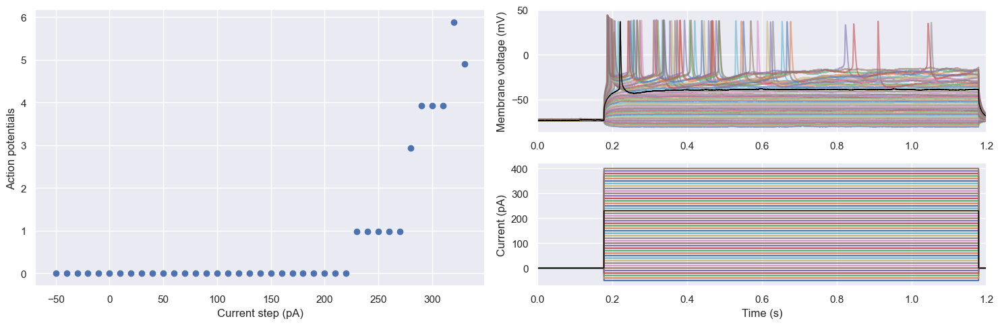

0.19275
2023_09_27_0048_slice4_cell1_cortex_layer2_100um-citrate_MSN_WT


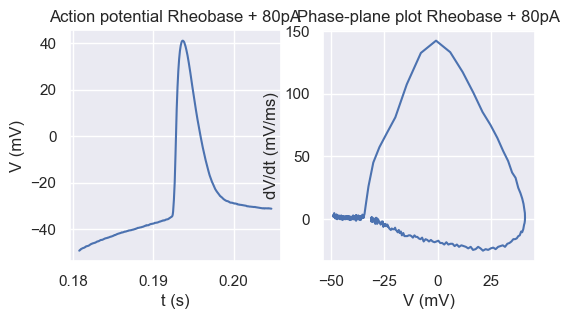

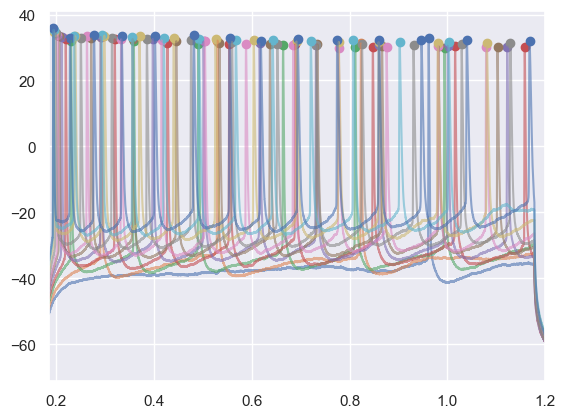

2023_09_27_0048_slice4_cell1_cortex_layer2_100um-citrate_MSN_WT


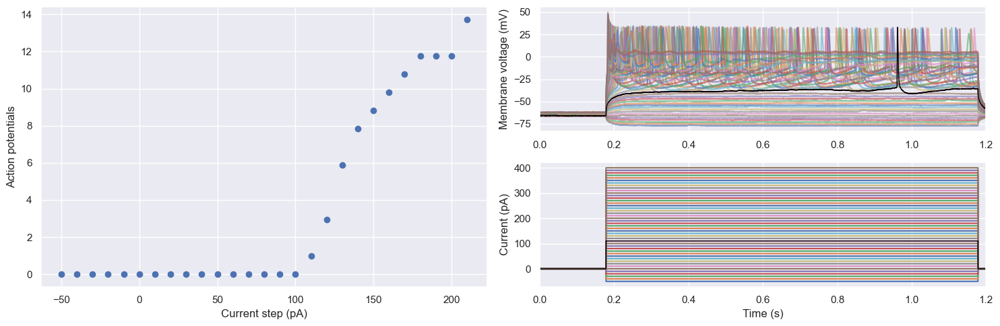

0.19385000000000002
2023_09_20_0049_slice3_cell2_cortex_layer2_50um-citrate_PN_WT


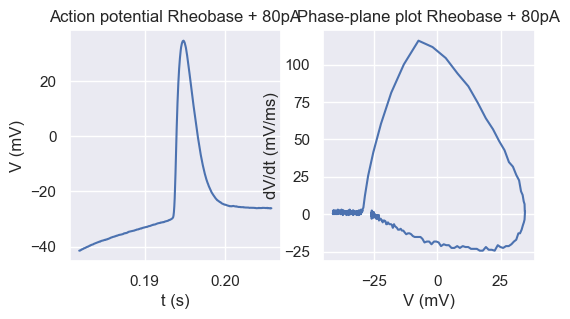

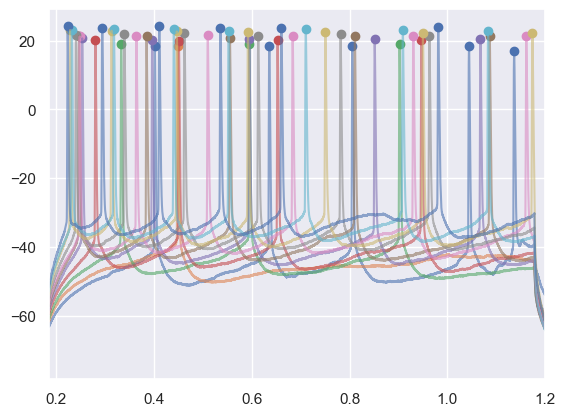

2023_09_20_0049_slice3_cell2_cortex_layer2_50um-citrate_PN_WT


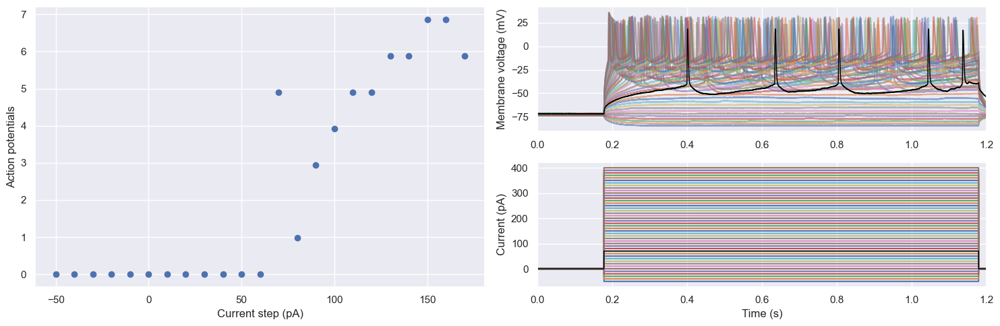

0.22685000000000002
2023_09_27_0045_slice4_cell1_cortex_layer2_50um-citrate_MSN_WT


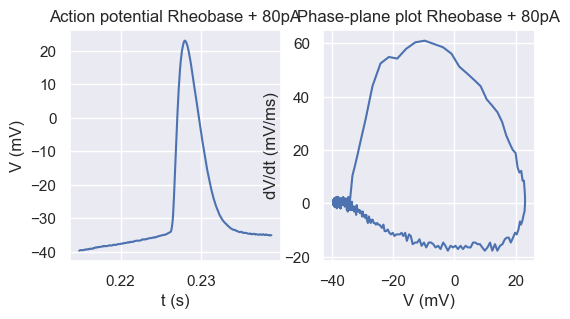

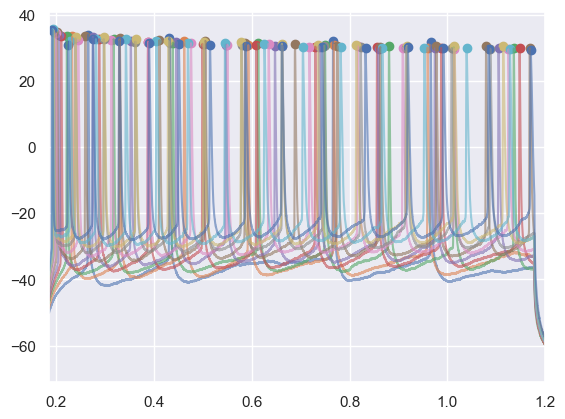

2023_09_27_0045_slice4_cell1_cortex_layer2_50um-citrate_MSN_WT


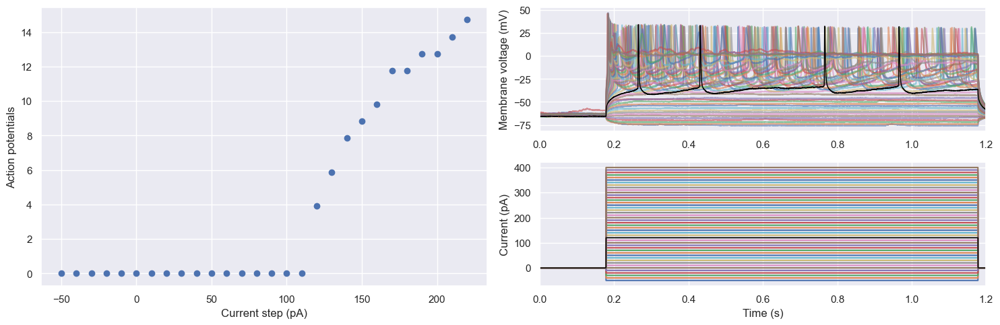

0.193
2023_10_01_0035_slice2_cell1_cortex_layer2_100um-citrate_MSN_KO


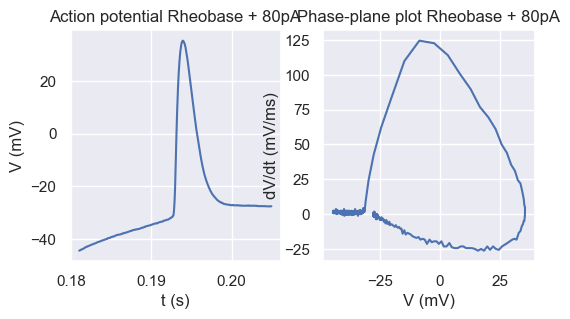

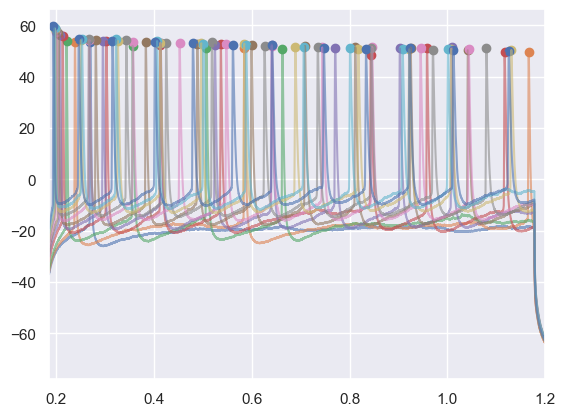

2023_10_01_0035_slice2_cell1_cortex_layer2_100um-citrate_MSN_KO


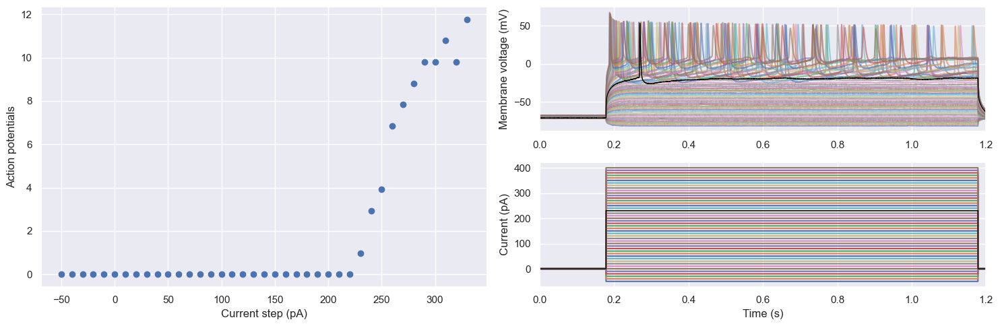

0.19575
2023_09_20_0018_slice1_cell1_cortex_layer2_no-treatment_PN_WT


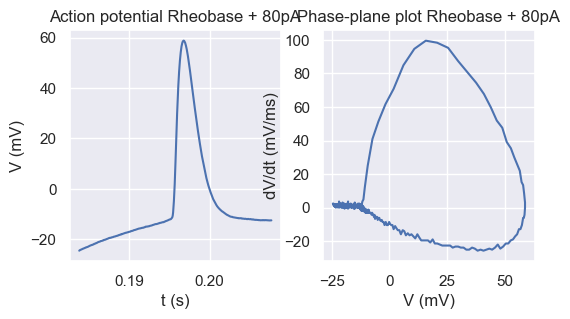

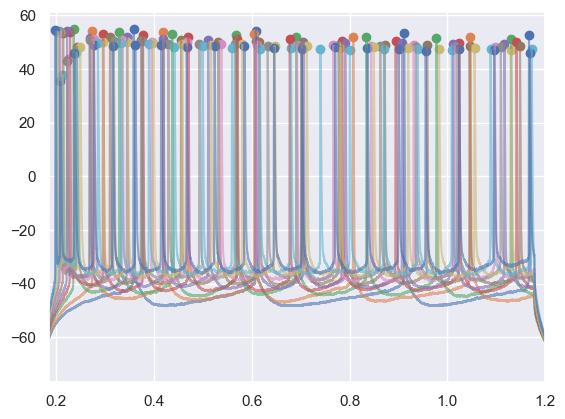

2023_09_20_0018_slice1_cell1_cortex_layer2_no-treatment_PN_WT


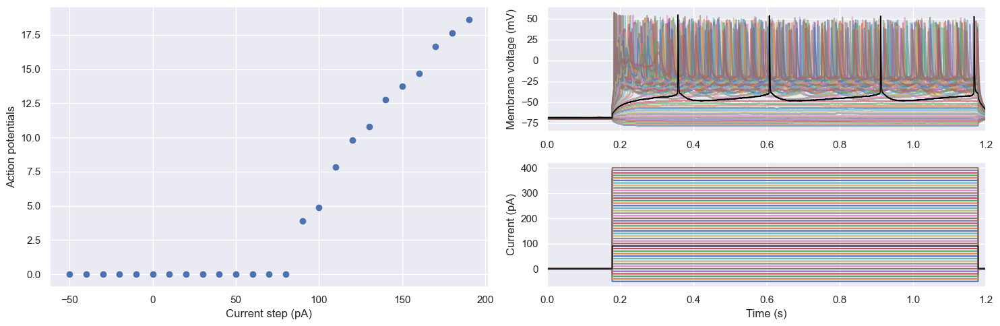

0.2018
2023_09_20_0021_slice1_cell1_cortex_layer2_25um-citrate_PN_WT


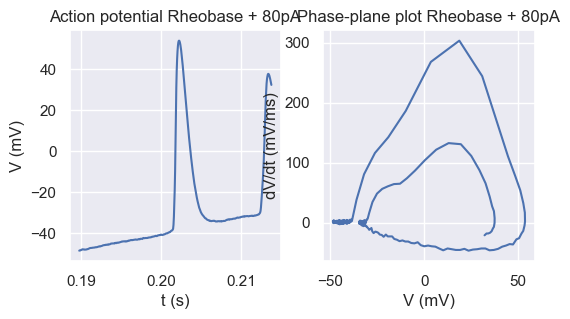

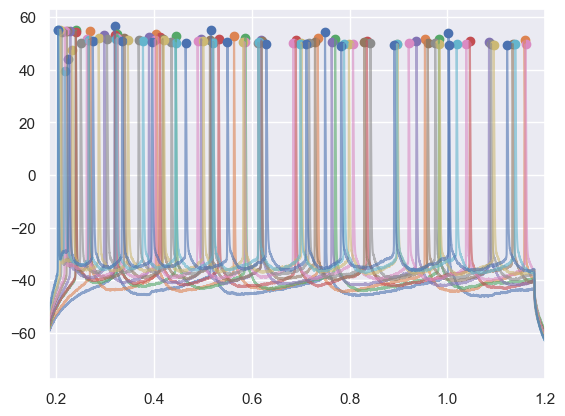

2023_09_20_0021_slice1_cell1_cortex_layer2_25um-citrate_PN_WT


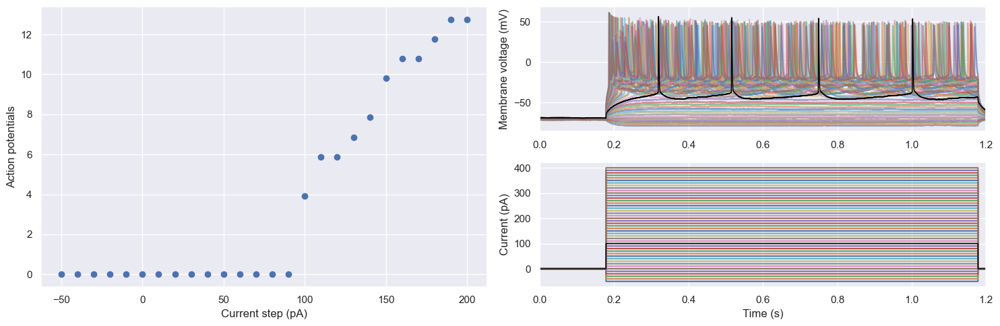

0.20745000000000002
2023_09_20_0031_slice1_cell1_cortex_layer2_200um-citrate_PN_WT


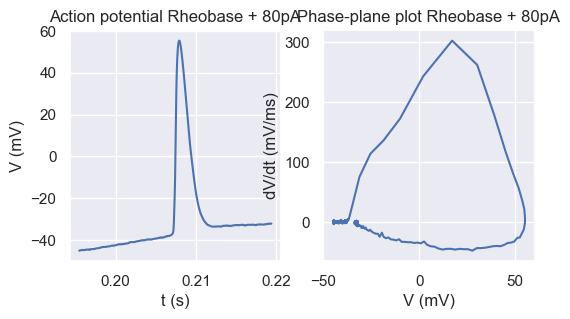

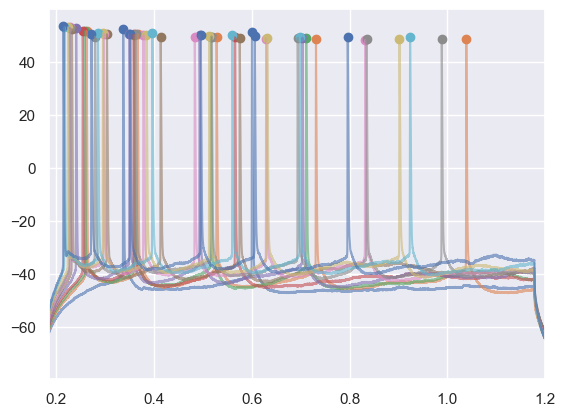

2023_09_20_0031_slice1_cell1_cortex_layer2_200um-citrate_PN_WT


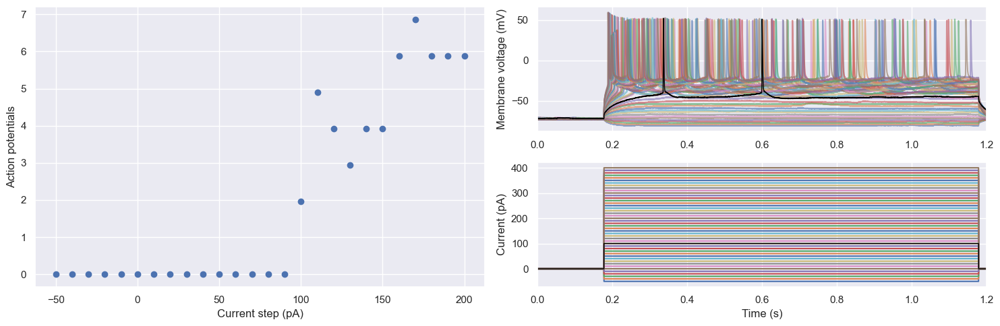

0.22335000000000002
2023_09_27_0039_slice4_cell1_cortex_layer2_no-treatment_MSN_WT


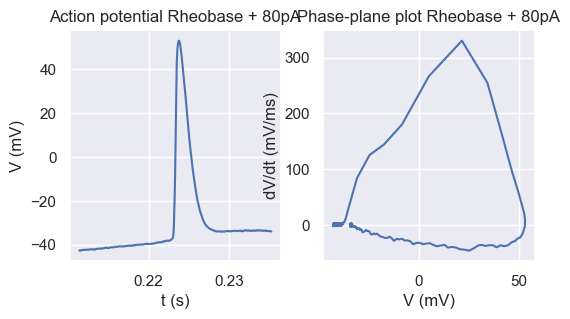

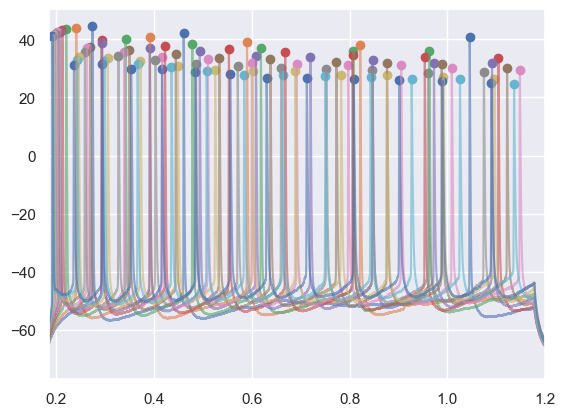

2023_09_27_0039_slice4_cell1_cortex_layer2_no-treatment_MSN_WT


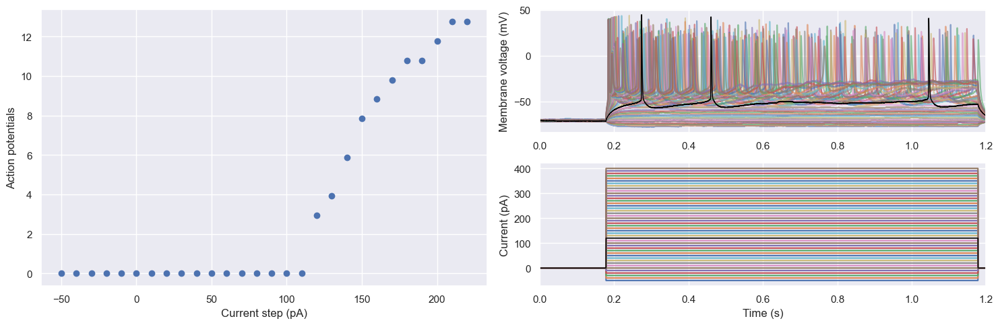

0.19390000000000002
2023_09_20_0046_slice3_cell2_cortex_layer2_25um-citrate_PN_WT


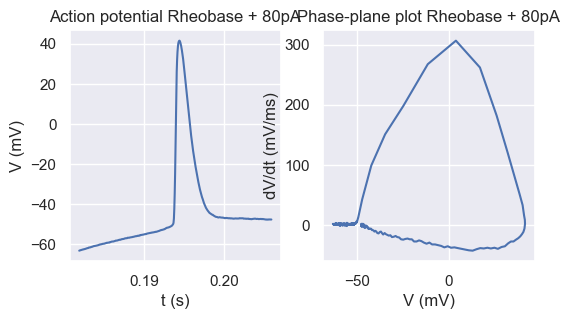

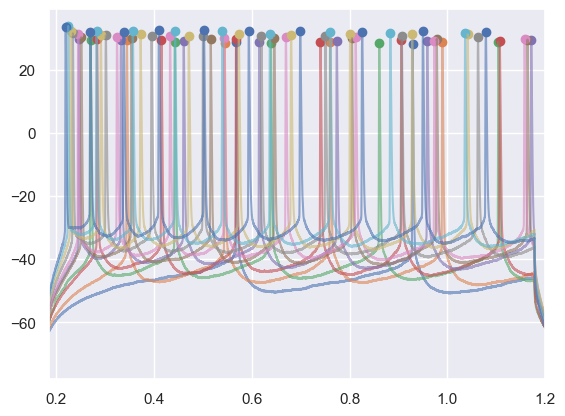

2023_09_20_0046_slice3_cell2_cortex_layer2_25um-citrate_PN_WT


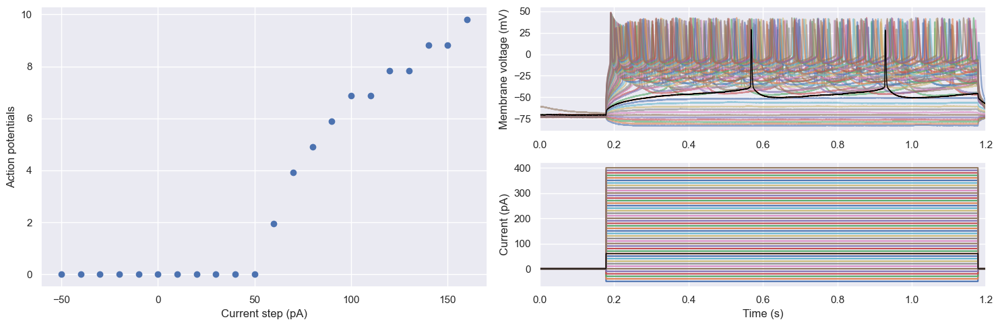

0.22795
2023_09_27_0010_slice2_cell1_cortex_layer2_no-treatment_MSN_WT


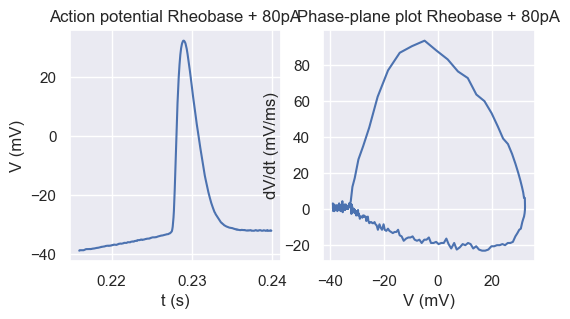

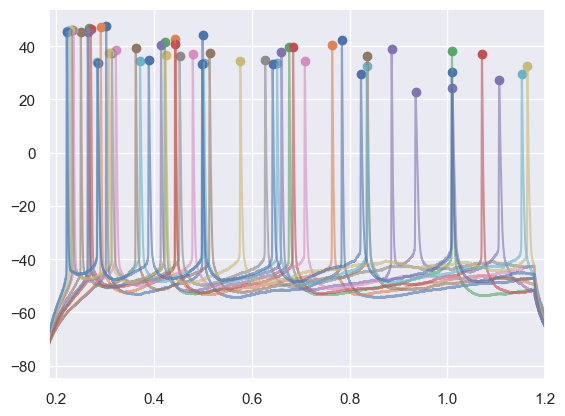

2023_09_27_0010_slice2_cell1_cortex_layer2_no-treatment_MSN_WT


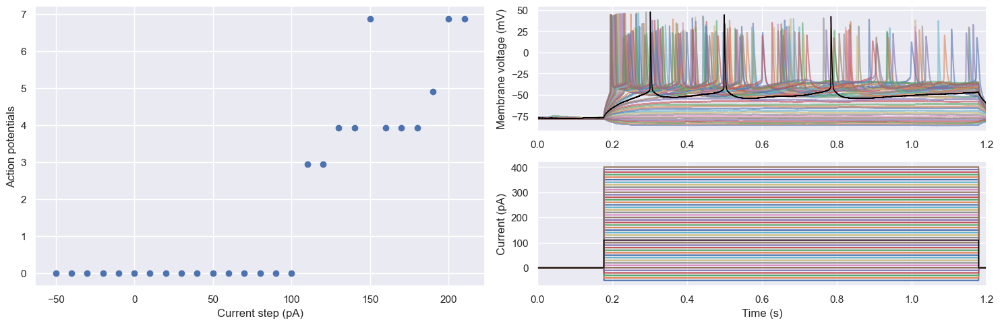

0.22725
2023_09_27_0016_slice2_cell1_cortex_layer2_50um-citrate_MSN_WT


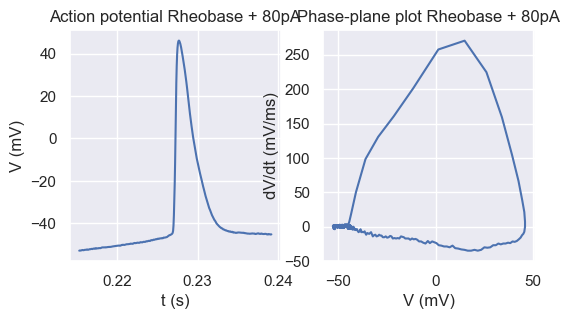

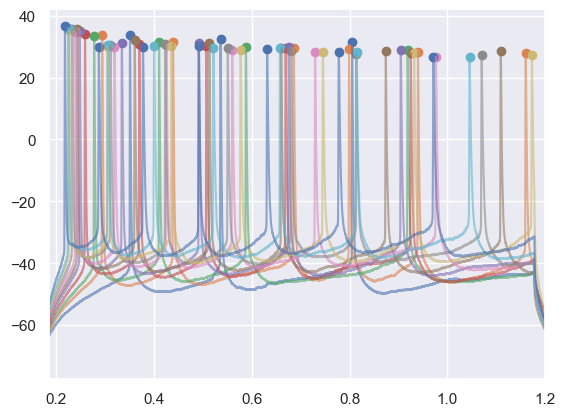

2023_09_27_0016_slice2_cell1_cortex_layer2_50um-citrate_MSN_WT


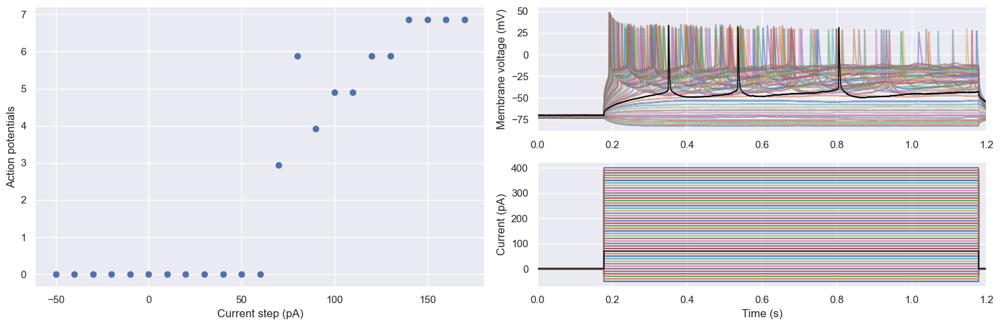

0.2255
2023_09_27_0071_slice5_cell1_cortex_layer2_400um-citrate_PN_WT


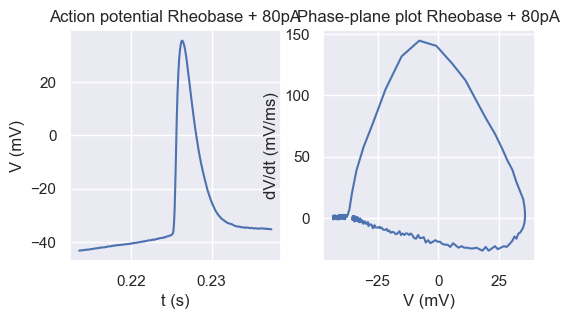

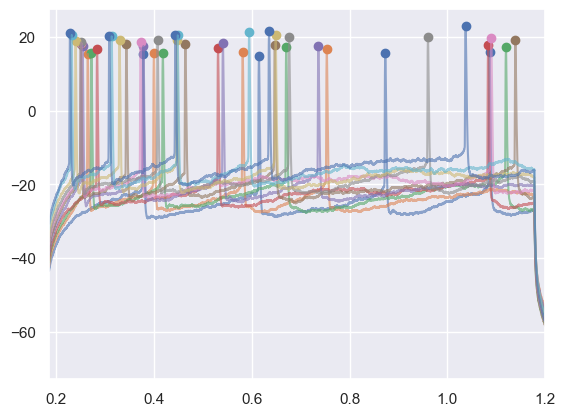

2023_09_27_0071_slice5_cell1_cortex_layer2_400um-citrate_PN_WT


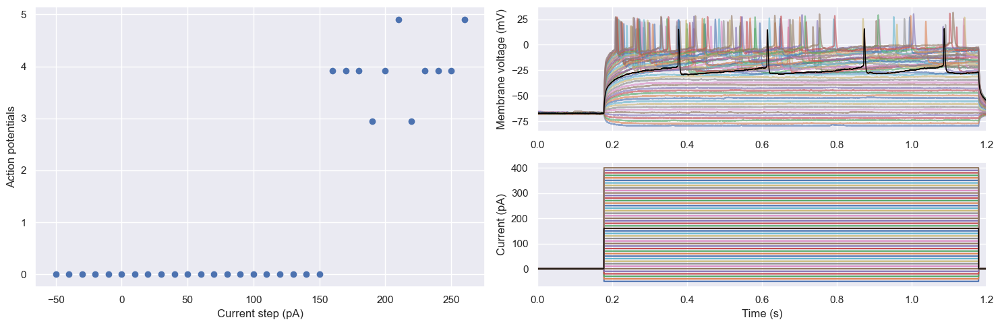

0.23800000000000002
2023_09_27_0013_slice2_cell1_cortex_layer2_25um-citrate_MSN_WT


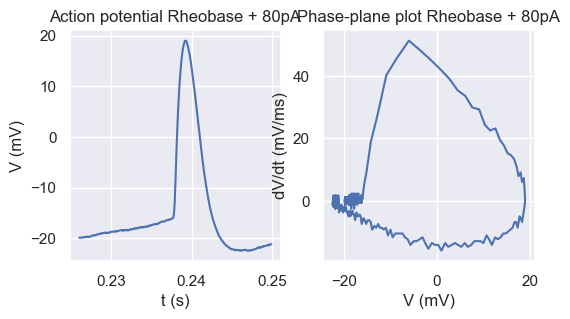

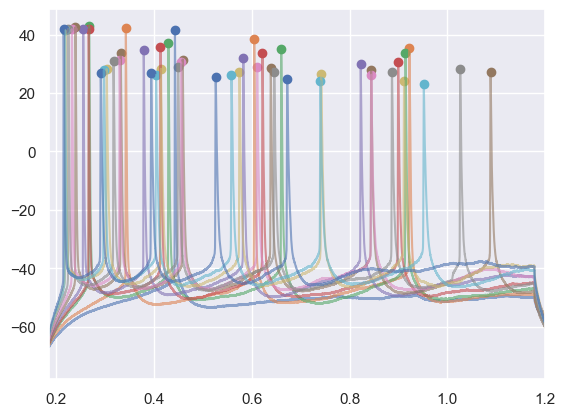

2023_09_27_0013_slice2_cell1_cortex_layer2_25um-citrate_MSN_WT


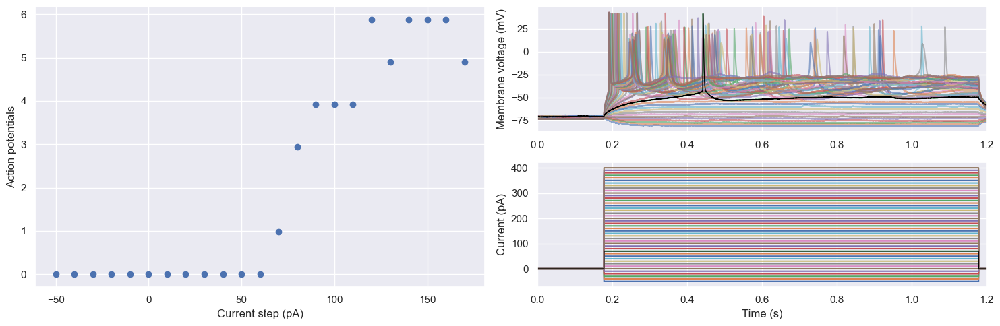

0.2179
2023_09_20_0028_slice1_cell1_cortex_layer2_100um-citrate_PN_WT


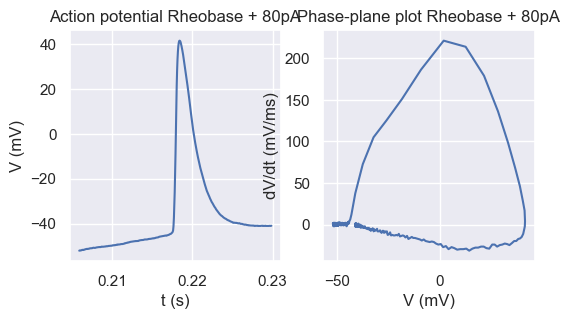

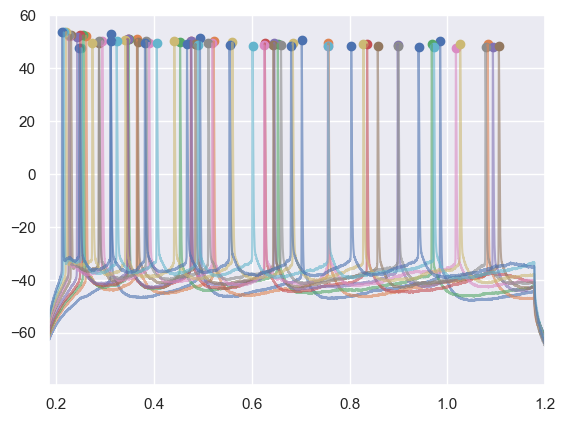

2023_09_20_0028_slice1_cell1_cortex_layer2_100um-citrate_PN_WT


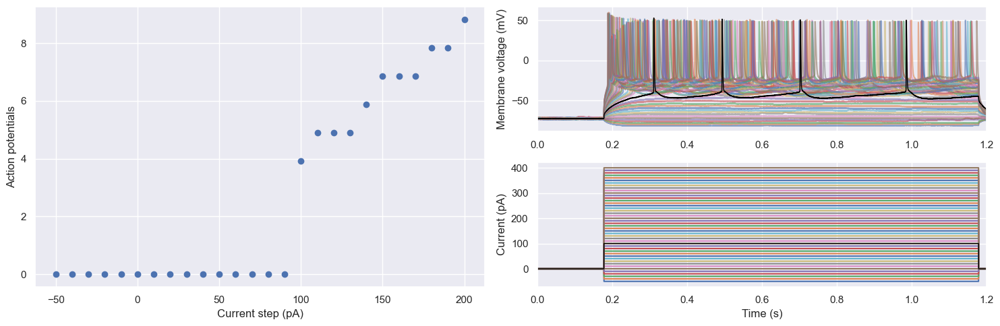

0.2194
2023_09_20_0043_slice3_cell2_cortex_layer2_no-treatment_PN_WT


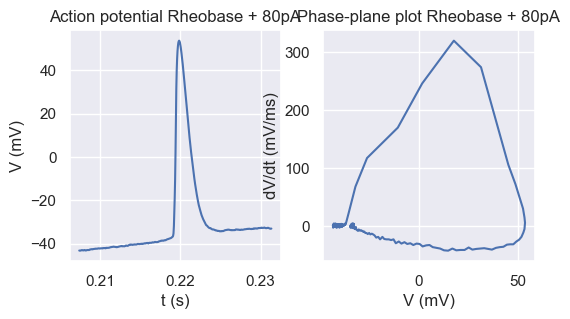

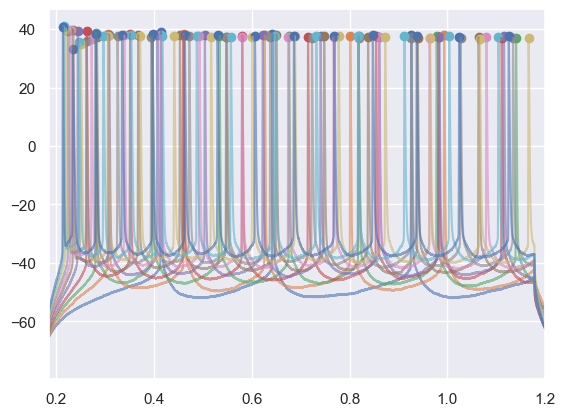

2023_09_20_0043_slice3_cell2_cortex_layer2_no-treatment_PN_WT


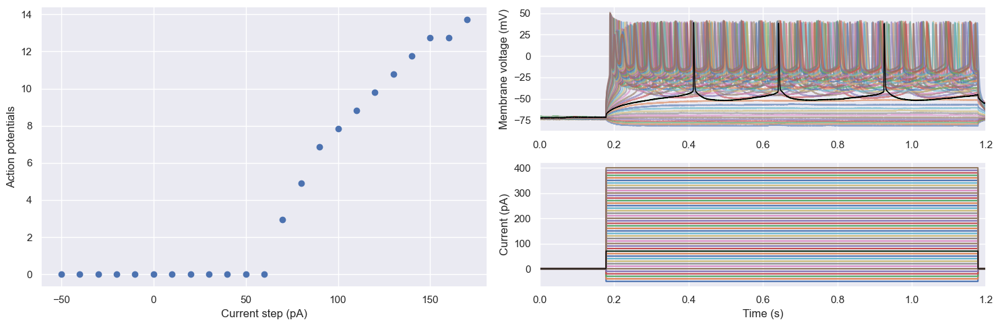

0.21835000000000002
2023_10_01_0036_slice2_cell1_cortex_layer2_200um-citrate_MSN_KO


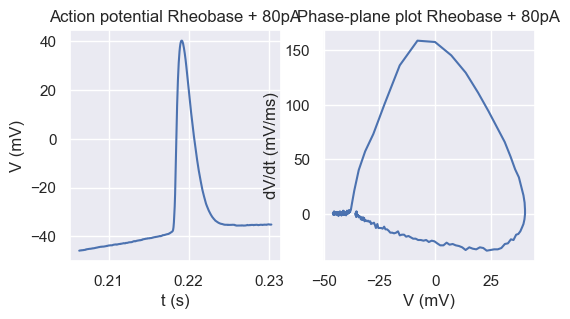

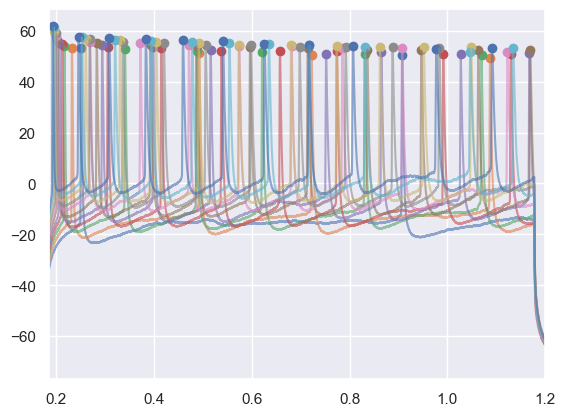

2023_10_01_0036_slice2_cell1_cortex_layer2_200um-citrate_MSN_KO


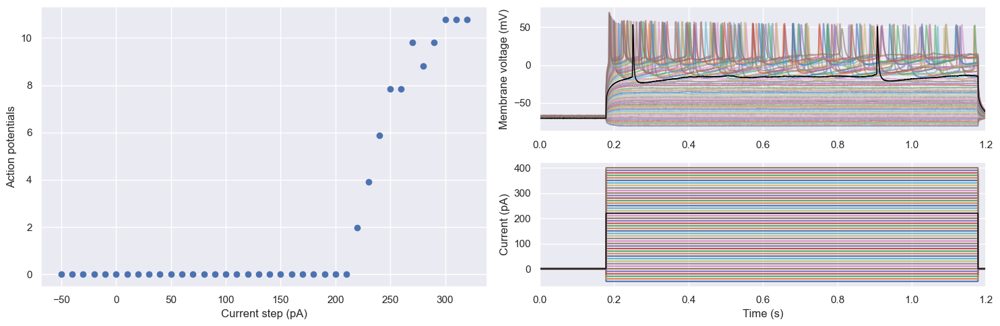

0.17815
2023_10_01_0032_slice2_cell1_cortex_layer2_50um-citrate_MSN_KO


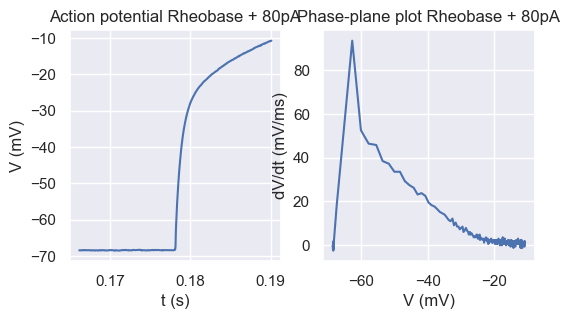

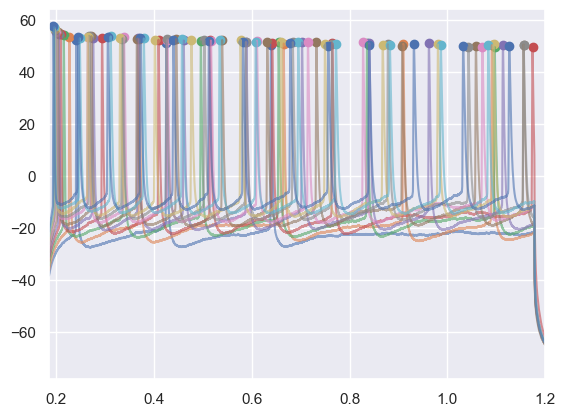

2023_10_01_0032_slice2_cell1_cortex_layer2_50um-citrate_MSN_KO


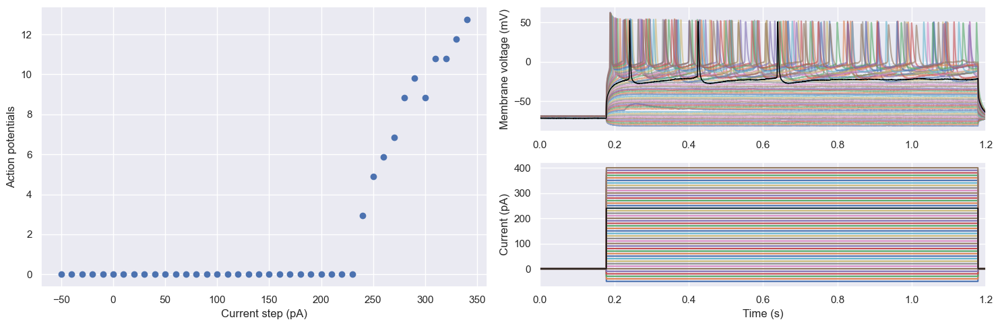

0.19545
2023_09_20_0034_slice1_cell1_cortex_layer2_400um-citrate_PN_WT


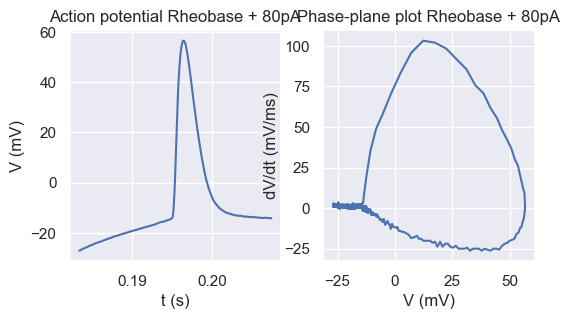

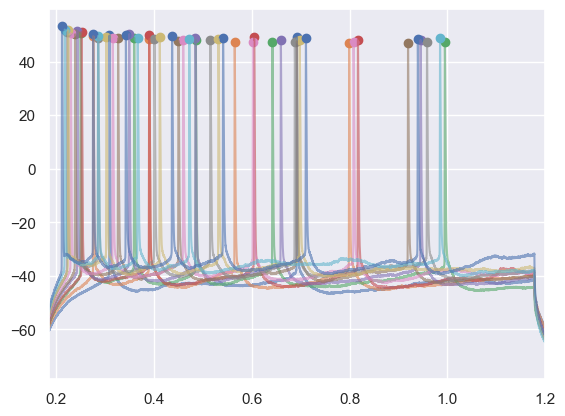

2023_09_20_0034_slice1_cell1_cortex_layer2_400um-citrate_PN_WT


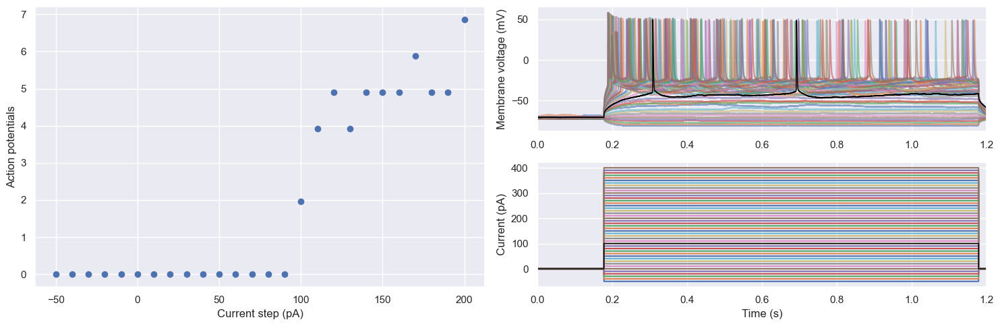

0.22385000000000002
2023_09_27_0056_slice5_cell1_cortex_layer2_no-treatment_PN_WT


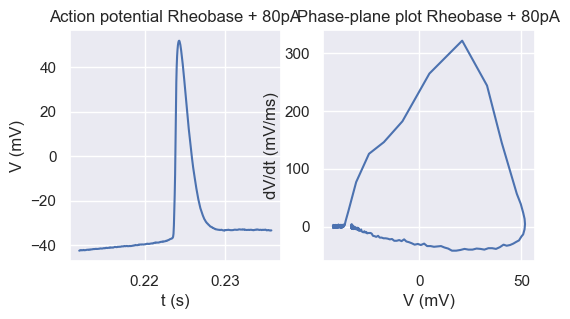

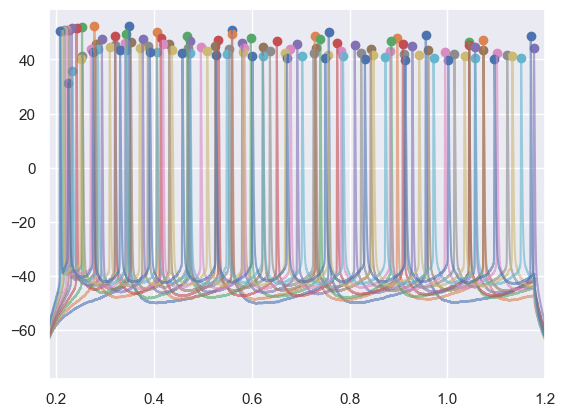

2023_09_27_0056_slice5_cell1_cortex_layer2_no-treatment_PN_WT


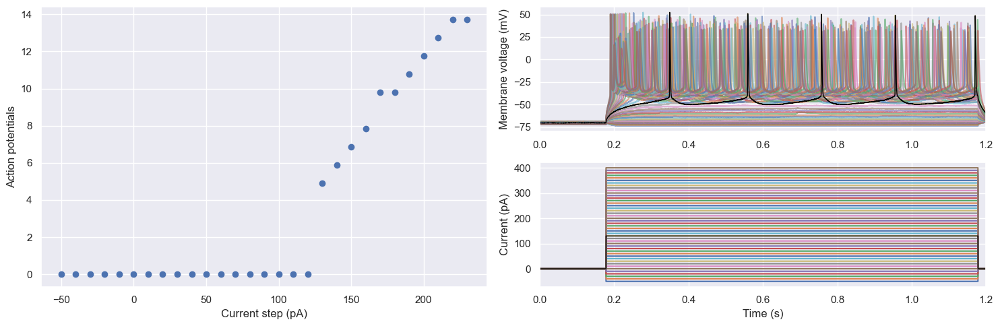

0.21280000000000002
2023_09_27_0054_slice4_cell1_cortex_layer2_400um-citrate_MSN_WT


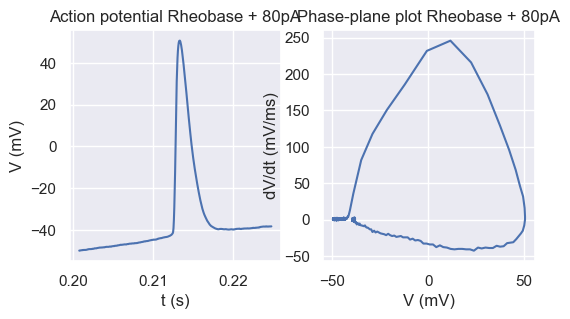

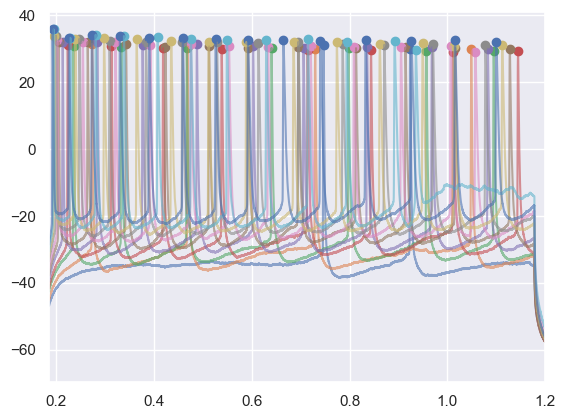

2023_09_27_0054_slice4_cell1_cortex_layer2_400um-citrate_MSN_WT


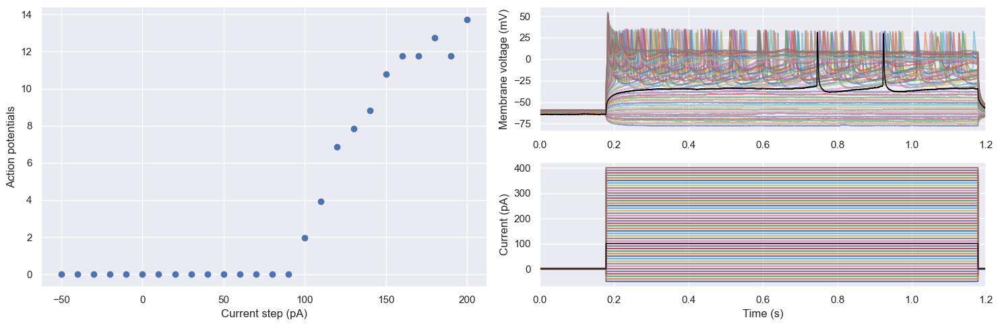

0.19435000000000002
2023_09_27_0042_slice4_cell1_cortex_layer2_25um-citrate_MSN_WT


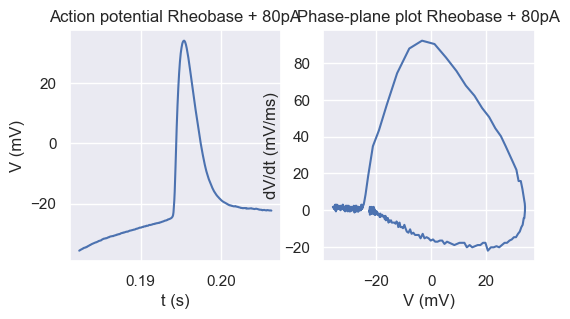

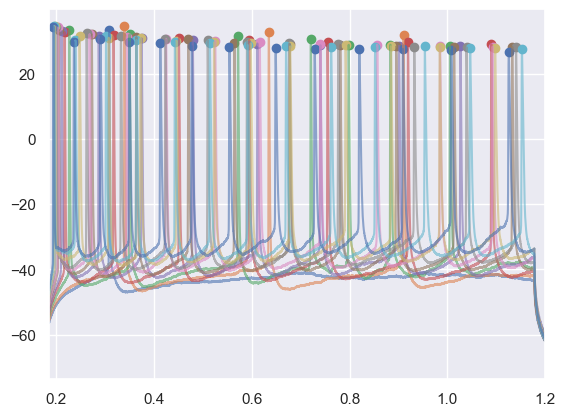

2023_09_27_0042_slice4_cell1_cortex_layer2_25um-citrate_MSN_WT


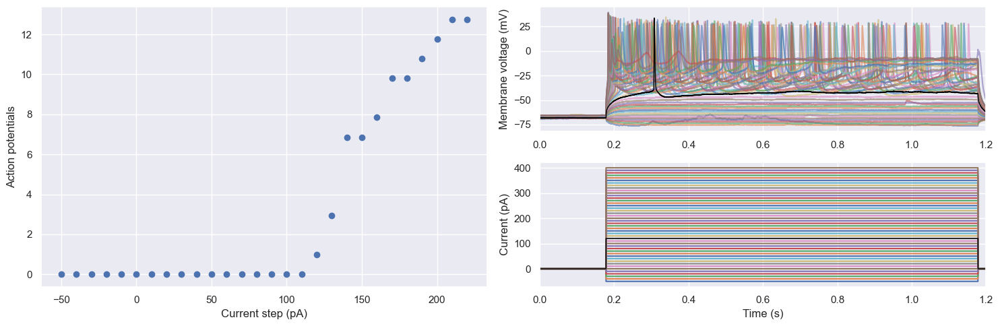

0.1956
2023_09_27_0068_slice5_cell1_cortex_layer2_200um-citrate_PN_WT


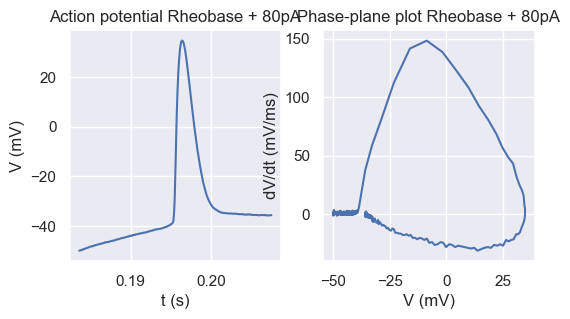

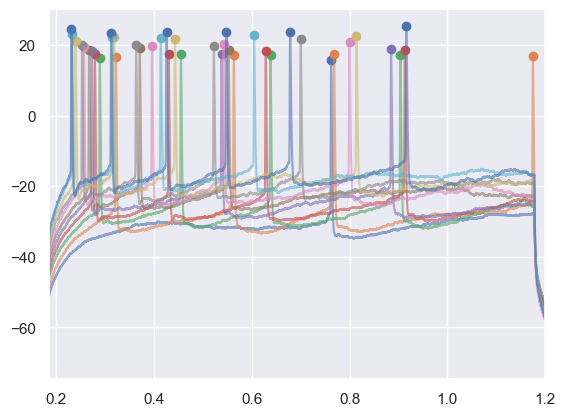

2023_09_27_0068_slice5_cell1_cortex_layer2_200um-citrate_PN_WT


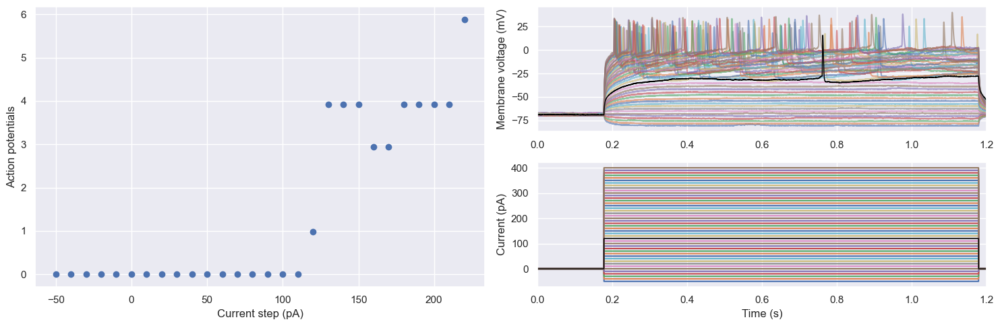

0.23795000000000002
2023_09_20_0055_slice3_cell2_cortex_layer2_200um-citrate_PN_WT


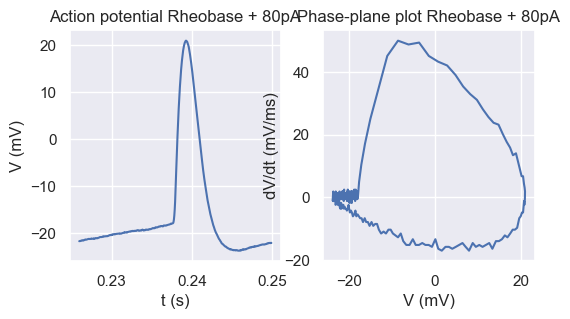

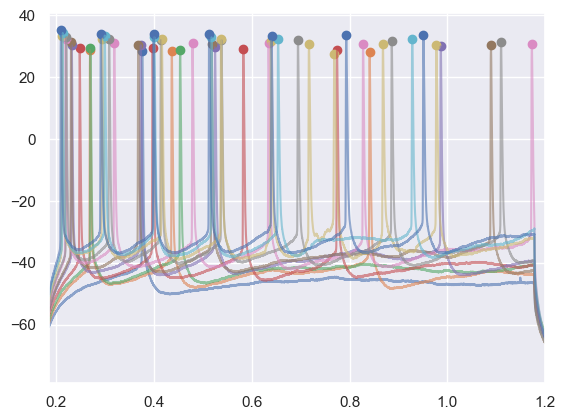

2023_09_20_0055_slice3_cell2_cortex_layer2_200um-citrate_PN_WT


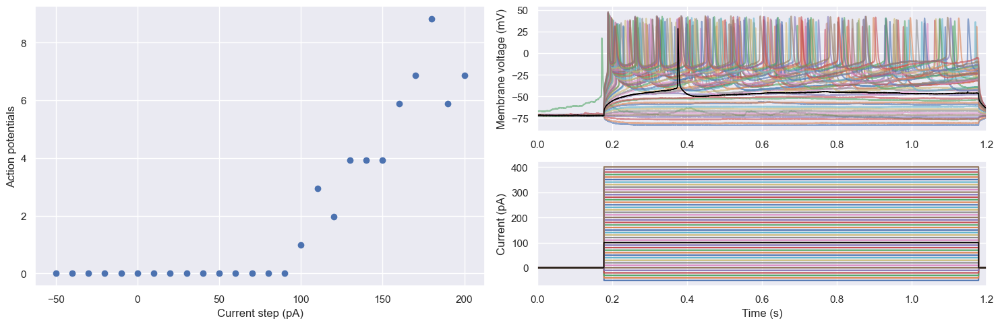

0.21080000000000002


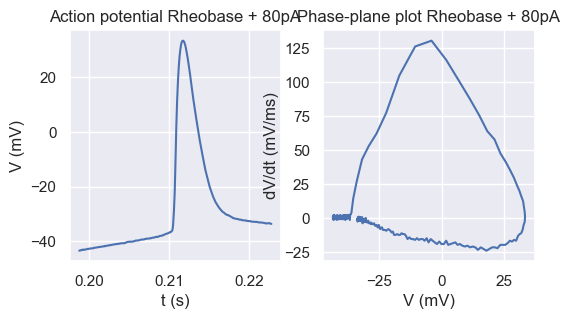

In [237]:
folder_path = '/Users/alicelin/Desktop/abf_files'
file_list = glob.glob(os.path.join(folder_path, "*.abf"))
compiled_indiv = pd.DataFrame()
compiled_agg = pd.DataFrame()
for file in file_list:
    current_file = spike_analysis(file)
    compiled_indiv = pd.concat([compiled_indiv, current_file])
    agg_current, rheobase = input_output(file)
    compiled_agg = pd.concat([compiled_agg, agg_current])
    phase_plots(file, rheobase)

In [230]:
compiled_indiv

,date,protocol_num,slice,cell,region,layer,treatment,cell_type,animal_genotype,file_name,sweep,threshold_index,clipped,threshold_t,threshold_v,threshold_i,peak_index,peak_t,peak_v,peak_i,trough_index,trough_t,trough_v,trough_i,upstroke_index,upstroke,upstroke_t,upstroke_v,downstroke_index,downstroke,downstroke_t,downstroke_v,isi_type,fast_trough_index,fast_trough_t,fast_trough_v,fast_trough_i,adp_index,adp_t,adp_v,adp_i,slow_trough_index,slow_trough_t,slow_trough_v,slow_trough_i,width,upstroke_downstroke_ratio
0,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,18,6308,False,0.31540,-25.787354,130.0,6339,0.31695,20.843506,130.0,7551,0.37755,-34.027100,130.0,6316,68.969731,0.31580,-13.580322,6361,-21.972656,0.31805,4.608154,detour,6438,0.32190,-31.738281,130.0,NaN,NaN,NaN,NaN,7551.0,0.37755,-34.027100,130.0,0.00265,3.138889
1,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,18,9950,False,0.49750,-25.665283,130.0,9982,0.49910,21.087646,130.0,10897,0.54485,-34.210205,130.0,9959,67.749028,0.49795,-13.641357,10003,-21.362305,0.50015,8.544922,detour,10082,0.50410,-31.372070,130.0,NaN,NaN,NaN,NaN,10897.0,0.54485,-34.210205,130.0,0.00280,3.171429
2,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,18,13530,False,0.67650,-25.360107,130.0,13564,0.67820,21.057129,130.0,14258,0.71290,-33.843994,130.0,13539,65.307622,0.67695,-13.000488,13583,-20.141602,0.67915,9.033203,detour,13667,0.68335,-31.188965,130.0,NaN,NaN,NaN,NaN,14258.0,0.71290,-33.843994,130.0,0.00290,3.242424
3,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,18,17004,False,0.85020,-24.963379,130.0,17037,0.85185,21.118164,130.0,17989,0.89945,-34.057617,130.0,17012,64.697270,0.85060,-14.068604,17064,-19.531250,0.85320,3.051758,detour,17151,0.85755,-30.273438,130.0,NaN,NaN,NaN,NaN,17989.0,0.89945,-34.057617,130.0,0.00290,3.312500
4,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,18,21530,False,1.07650,-25.054932,130.0,21562,1.07810,20.568848,130.0,23999,1.19995,-57.189941,0.0,21538,63.476567,1.07690,-12.451172,23563,-23.803711,1.17815,-33.691406,detour,23634,1.18170,-48.706055,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00385,2.666667
0,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,19,5475,False,0.27375,-25.360107,140.0,5507,0.27535,21.972656,140.0,6491,0.32455,-31.311035,140.0,5483,68.969731,0.27415,-16.326904,5530,-21.972656,0.27650,6.072998,detour,5602,0.28010,-30.456543,140.0,NaN,NaN,NaN,NaN,6491.0,0.32455,-31.311035,140.0,0.00275,3.138889
1,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,19,8161,False,0.40805,-24.566650,140.0,8194,0.40970,21.636963,140.0,8948,0.44740,-31.890869,140.0,8170,65.917973,0.40850,-12.207031,8219,-19.531250,0.41095,5.676270,detour,8302,0.41510,-29.846191,140.0,NaN,NaN,NaN,NaN,8948.0,0.44740,-31.890869,140.0,0.00290,3.375000
2,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,19,11234,False,0.56170,-24.261475,140.0,11266,0.56330,21.759033,140.0,11927,0.59635,-32.012939,140.0,11241,63.476567,0.56205,-14.465332,11287,-19.531250,0.56435,9.368896,detour,11383,0.56915,-29.724121,140.0,NaN,NaN,NaN,NaN,11927.0,0.59635,-32.012939,140.0,0.00295,3.250000
3,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,19,15029,False,0.75145,-23.193359,140.0,15063,0.75315,21.942139,140.0,16245,0.81225,-33.264160,140.0,15038,62.255864,0.75190,-10.711670,15078,-18.920900,0.75390,13.946533,detour,15162,0.75810,-27.832031,140.0,NaN,NaN,NaN,NaN,16245.0,0.81225,-33.264160,140.0,0.00290,3.290323
4,20230927,0065,slice5,cell1,cortex,layer2,

In [231]:
temp = compiled_agg.groupby(['animal_genotype', 'cell_type', 'treatment', 'current_step'])['avg_rate'].agg(['mean', 'std', 'count'])
temp

mean       std  \
animal_genotype cell_type treatment     current_step                        
KO              MSN       100um-citrate -50.0          0.000000       NaN   
                                        -40.0          0.000000       NaN   
                                        -30.0          0.000000       NaN   
                                        -20.0          0.000000       NaN   
                                        -10.0          0.000000       NaN   
                                         0.0           0.000000       NaN   
                                         10.0          0.000000       NaN   
                                         20.0          0.000000       NaN   
                                         30.0          0.000000       NaN   
                                         40.0          0.000000       NaN   
                                         50.0          0.000000       NaN   
                                         60.0          0.000000       NaN   
                                         70.0          0.000000       NaN   
                                         80.0          0.000000       NaN   
                                         90.0          0.000000       NaN   
                                         100.0         0.000000       NaN   
                                         110.0         0.000000       NaN   
                                         120.0         0.000000       NaN   
                                         130.0         0.000000       NaN   
                                         140.0         0.000000       NaN   
                                         150.0         0.000000       NaN   
                                         160.0         0.000000       NaN   
                                         170.0         0.000000       NaN   
                                         180.0         0.000000       NaN   
                                         190.0         0.000000       NaN   
                                         200.0         0.000000       NaN   
                                         210.0         0.000000       NaN   
                                         220.0         0.000000       NaN   
                                         230.0         0.980344       NaN   
                                         240.0         2.941032       NaN   
                                         250.0         3.921376       NaN   
                                         260.0         6.862409       NaN   
                                         270.0         7.842753       NaN   
                                         280.0         8.823097       NaN   
                                         290.0         9.803441       NaN   
                                         300.0         9.803441       NaN   
                                         310.0        10.783785       NaN   
                                         320.0         9.803441       NaN   
                                         330.0        11.764129       NaN   
                          200um-citrate -50.0          0.000000       NaN   
                                        -40.0          0.000000       NaN   
                                        -30.0          0.000000       NaN   
                                        -20.0          0.000000       NaN   
                                        -10.0          0.000000       NaN   
                                         0.0           0.000000       NaN   
                                         10.0          0.000000       NaN   
                                         20.0          0.000000       NaN   
                                         30.0          0.000000       NaN   
                                         40.0          0.000000       NaN   
                                         50.0          0.000000       NaN   
                                         60.0          

[[-72.3267 -72.3267 -72.3572 ... -72.998  -72.937  -72.937 ]
 [-68.9087 -68.9392 -69.0002 ... -69.2444 -69.3054 -69.3359]
 [-65.8569 -65.7959 -65.8264 ... -66.1621 -66.1011 -66.1621]
 ...
 [-75.3784 -75.4395 -75.3479 ... -75.1648 -75.1038 -75.1038]
 [-65.6128 -65.6128 -65.6128 ... -65.6128 -65.6128 -65.6128]
 [-70.3125 -70.3125 -70.343  ... -70.0073 -69.9768 -70.0378]]
[0 0 1 ... 0 1 0]


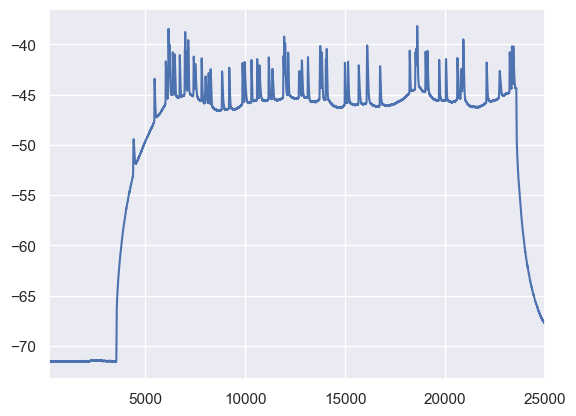

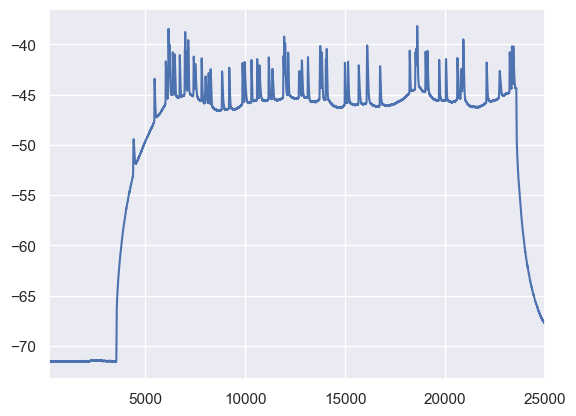

In [54]:

from sklearn.cluster import KMeans
X = np.array(voltage_list)
print(X)
kmeans = KMeans(n_clusters=2, random_state=0).fit(X)
print(kmeans.labels_)
plt.plot(kmeans.cluster_centers_[kmeans.labels_[0]])
plt.xlim([200, 25000])
plt.show()

plt.plot(kmeans.cluster_centers_[kmeans.labels_[1]])
plt.xlim([200, 25000])
plt.show()
#plt.plot(kmeans.cluster_centers_[kmeans.labels_[2]])
#plt.plot(abf2.sweepY, 'r')
# plt.xlim([200, 25000])
# plt.show()

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

NameError: name 'rheobase' is not defined

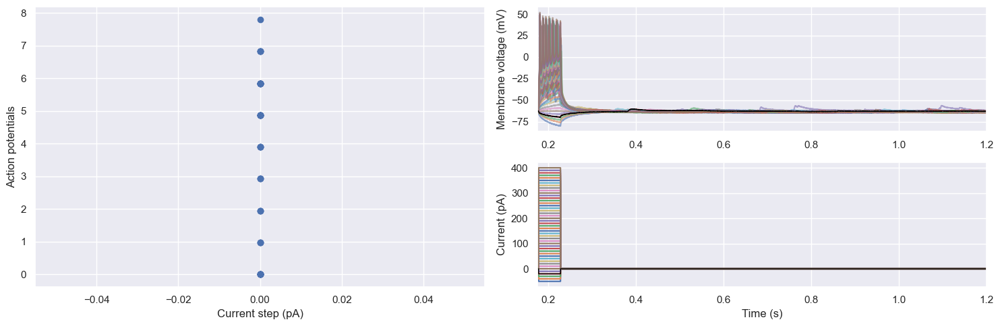

In [5]:

      

fig1 = plt.figure(figsize=(15, 5))
 
# Input-output curve
ax1 = fig1.add_subplot(1, 2, 1)
currents = []
for sweep in abf.sweepList:
    abf.setSweep(sweep)
    currents.append(np.average(abf.sweepC[t1:t2]))
ax1.scatter(currents, table.loc[:,'avg_rate'])
ax1.set_xlabel('Current step (pA)')
ax1.set_ylabel('Action potentials')
 
# All traces
ax2 = fig1.add_subplot(2, 2, 2)
for sweep in abf.sweepList:
    abf.setSweep(sweep)
    ax2.plot(abf.sweepX, abf.sweepY, alpha=.6, label="Sweep %d" % (sweep))
ax2.set_ylabel('Membrane voltage (mV)')
# ax2.legend() # Optional
# To highllight one trace
abf.setSweep(3) 
ax2.plot(abf.sweepX, abf.sweepY, linewidth=1, color='black')
ax2.axes.set_xlim(0.175, 1.2) # Range of the x-axis (seconds)
 
# All current steps
ax3 = fig1.add_subplot(2, 2, 4, sharex=ax2) 
for sweep in abf.sweepList:
    abf.setSweep(sweep)
    current = abf.sweepC
    ax3.plot(abf.sweepX, current)
ax3.set_ylabel("Current (pA)")
ax3.set_xlabel("Time (s)")
# To highllight one current trace
abf.setSweep(3) 
ax3.plot(abf.sweepX, abf.sweepC, linewidth=1, color='black')
fig1.tight_layout()

# Inputs (the abf file, sweep number, sampling rate, half-window in ms)
dv_dt40 = dv_dt(abf, rheobase+4, 20000, 12)
# Table with the voltage and dV/dt values
table40 = pd.DataFrame(columns = ['voltage', 'dv_dt'])
table40['voltage'] = pd.Series(dv_dt40['voltage'])
table40['dv_dt'] = pd.Series(dv_dt40['dv_dt'])

# Inputs (the abf file, sweep number, sampling rate, half-window in ms)
dv_dt80 = dv_dt(abf, rheobase+8, 20000, 12)
# Table with the voltage and dV/dt values
table80 = pd.DataFrame(columns = ['voltage', 'dv_dt'])
table80['voltage'] = pd.Series(dv_dt80['voltage'])
table80['dv_dt'] = pd.Series(dv_dt80['dv_dt'])
 
# Graphs
fig2 = plt.figure(figsize=(6, 3))
# Action potential
ax1 = fig2.add_subplot(121)
ax1.set_title('Action potential Rheobase + 40pA')
ax1.plot(dv_dt40['time'], dv_dt40['voltage'])
ax1.set_ylabel("V (mV)") 
ax1.set_xlabel("t (s)")
 
# Phase plot
ax2 =fig2.add_subplot(122)
ax2.set_title('Phase-plane plot Rheobase + 40pA')
ax2.plot(dv_dt40['voltage_array'], dv_dt40['dv_dt'])
ax2.set_ylabel("dV/dt (mV/ms)") 
ax2.set_xlabel("V (mV)") 

# Graphs
fig3 = plt.figure(figsize=(6, 3))
# Action potential
ax1 = fig3.add_subplot(121)
ax1.set_title('Action potential Rheobase + 80pA')
ax1.plot(dv_dt80['time'], dv_dt80['voltage'])
ax1.set_ylabel("V (mV)") 
ax1.set_xlabel("t (s)")
 
# Phase plot
ax2 =fig3.add_subplot(122)
ax2.set_title('Phase-plane plot Rheobase + 80pA')
ax2.plot(dv_dt80['voltage_array'], dv_dt80['dv_dt'])
ax2.set_ylabel("dV/dt (mV/ms)") 
ax2.set_xlabel("V (mV)") 
 
# Show maximum dv/dt value, graph and table
print('dv/dt max =', dv_dt40['dv_dt_max'])
 
# Optional: Export the graph (png) and the table (csv)
#fig.savefig("Path/to/file/filename.png", dpi=300)
#table.to_csv('Path/to/file/filename.csv')
 
# Show the graph and the table results 
plt.show()
table

0.17815


Text(0.5, 0, 'V (mV)')

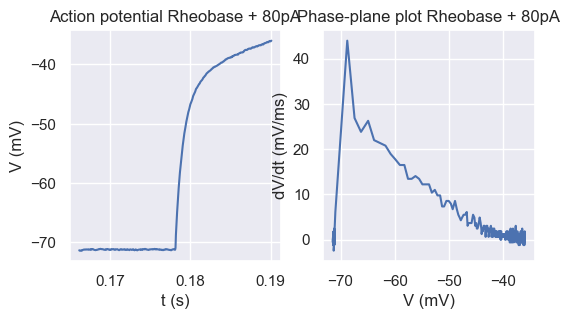